# **Project 3: SSL for Anomaly Detection**

## **Introduction to SSL and Anomaly Detection**

### **Self-Supervised Learning (SSL)**:
Self-Supervised Learning is a machine learning technique where models learn to generate useful representations from unlabeled data. It achieves this by solving pretext tasks, such as:
- Predicting masked regions (masked autoencoders).
- Comparing positive/negative pairs (contrastive learning).
- Reconstructing missing data (inpainting or colorization).

SSL is particularly useful in scenarios with limited labeled data, as it allows leveraging large amounts of unlabeled data to pretrain models.

### **Anomaly Detection (AD)**:
Anomaly Detection involves identifying data points that deviate significantly from the normal distribution. These anomalies often indicate errors, defects, or rare events. By training on normal data, models can identify anything that doesn’t fit as an anomaly. Common techniques include:
- Using statistical thresholds or distance-based methods.
- Leveraging machine learning models to score deviations.

--- 

This project aims to train and compare various Self-Supervised Learning (SSL) strategies for anomaly detection tasks. To do this, SSL models are used to learn representations of normal data, and their reconstruction or prediction errors serve as anomaly scores. The main steps include:

1. **Data Preparation**:
   - Download and prepare datasets for training and testing.
   - Visualize the distribution of data samples and merge anomaly classes where applicable.

2. **Model's Implementation**:
   - Implement shared architectures and task-specific models for colorization, inpainting, and masked autoencoders.

3. **Model's Training for Pretext Tasks**:
   - Tune hyperparameters such as learning rate, latent dimensions, and masked ratio (size).
   - Train models with optimal parameters and validate performance on pretext tasks.

4. **Downstream Task: Anomaly Detection**:
   - Design scoring strategies based on reconstruction errors.
   - Optimize the top-k parameter for anomaly detection.
   - Evaluate models on validation and test datasets.
   - Perform ensemble voting across models to improve detection performance.

## **Library Import**

In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import os
import urllib.request
import zipfile
import tarfile
import matplotlib.pyplot as plt
import numpy as np
import random
import pandas as pd
import pickle
import seaborn as sns

from sklearn.metrics import roc_curve, auc, confusion_matrix, f1_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchvision import transforms, datasets
from torch.utils.data import Dataset, DataLoader, Subset
from collections import Counter

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


# **1. Data Preparation**

## **1.1. Dataset Download**

This function, `download_and_extract`, handles the downloading, extraction, and preparation of datasets efficiently. It ensures that data is stored in a specified directory and avoids redundant downloads or extractions by checking existing files. Key steps include:

1. **Directory Creation**:
   - Checks if the specified data directory exists. If not, creates it.

2. **Dataset Download**:
   - Downloads the dataset from the provided URL if it's not already available locally.

3. **Dataset Extraction**:
   - Extracts the dataset (supports `.zip` and `.tar.xz` formats) into the specified folder, avoiding re-extraction if the folder is already populated.

**Why Store Data in `/tmp`?**
- The `/tmp` directory is a temporary storage location that resides in memory (RAM) in many systems. This makes file read/write operations much faster compared to storing data on a traditional hard disk or even SSD.
- Using `/tmp` is especially beneficial in scenarios where the dataset is frequently accessed or when speed is critical, such as training or testing machine learning models.
- However, note that `/tmp` storage is volatile and will be cleared after a system reboot, so it should only be used for temporary data that doesn't need to persist.

In [5]:
# Function to download and extract datasets
def download_and_extract(data_dir, data_file_name, data_url, extract_folder):
    download_path = os.path.join(data_dir, data_file_name)

    # Create data directory if not exists
    if not os.path.exists(data_dir):
        os.makedirs(data_dir)

    # Download file if not exists
    if not os.path.exists(download_path):
        print(f"Downloading {data_file_name}...")
        urllib.request.urlretrieve(data_url, download_path)
        print(f"Downloaded {data_file_name}.")
    else:
        print(f"{data_file_name} already exists.")

    # Extract file if not already extracted
    if not os.path.exists(extract_folder) or not os.listdir(extract_folder):
        print(f"Extracting {data_file_name}...")
        if data_file_name.endswith('.zip'):
            with zipfile.ZipFile(download_path, 'r') as zip_ref:
                zip_ref.extractall(extract_folder)
        elif data_file_name.endswith('.tar.xz'):
            with tarfile.open(download_path, 'r:xz') as tar_ref:
                tar_ref.extractall(extract_folder)
        print(f"Extracted contents of {data_file_name} to {extract_folder}.")
    else:
        print(f"Contents already extracted to {extract_folder}.")

# Configuration for datasets
data_configurations = [
    {
        "data_dir": "/tmp/engine_wiring",
        "data_file_name": "engine_wiring.zip",
        "data_url": "https://zenodo.org/records/10459003/files/engine_wiring.zip?download=1",
        "extract_folder": "/tmp/engine_wiring/contents"
    },
    {
        "data_dir": "/tmp/mvtec_ad",
        "data_file_name": "mvtec_anomaly_detection.tar.xz",
        "data_url": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420938113-1629952094/mvtec_anomaly_detection.tar.xz",
        "extract_folder": "/tmp/mvtec_ad/contents"
    }
]

# Download and extract each dataset
for config in data_configurations:
    download_and_extract(
        data_dir=config["data_dir"],
        data_file_name=config["data_file_name"],
        data_url=config["data_url"],
        extract_folder=config["extract_folder"]
    )

engine_wiring.zip already exists.
Contents already extracted to /tmp/engine_wiring/contents.
mvtec_anomaly_detection.tar.xz already exists.
Contents already extracted to /tmp/mvtec_ad/contents.


## **1.2. Data Loaders for Training and Testing**

This function, `load_datasets`, is used to create data loaders for both training and testing datasets. The function is designed to handle academic datasets (e.g., `MVTec AD`, `AutoVI`) with specific configurations. Key features include:

1. **Dataset Restrictions**:
   - For `MVTec AD`, only specific categories (`bottle`, `capsule`, `hazelnut`, `toothbrush`) are included by default.
   - The function supports a `restricted` option to filter the categories of interest.

2. **Anomaly Merging Option**:
   - The `merge_anomaly` option groups all classes except `good` into a single `anomaly` class for evaluation purposes. This is useful for downstream tasks, such as binary anomaly detection.

3. **Transformations**:
   - The images are resized to a fixed size (`IMAGE_SIZE`) and converted to tensors using PyTorch transformations. This ensures consistency across datasets.

In [6]:
BATCH_SIZE = 16
IMAGE_SIZE = 256

# Define the transformations to apply to the images
transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
])

# Function to load datasets (mvtec and engine_wiring)
def load_datasets(root_directories, batch_size=BATCH_SIZE, restricted=True, merge_anomaly=False):
    # Restricted categories for MVTec
    restricted_categories = ['bottle', 'capsule', 'hazelnut', 'toothbrush']

    # Dictionary to store all train and test loaders
    train_loaders = {}
    test_loaders = {}

    for dataset_name, root_dir in root_directories.items():
        if dataset_name == "mvtec_ad":
            # Load all or restricted categories for MVTec
            categories = os.listdir(root_dir)  # Get all categories from extracted folder
            if restricted:
                categories = [cat for cat in categories if cat in restricted_categories]

            for category in categories:
                train_path = os.path.join(root_dir, category, 'train')
                test_path = os.path.join(root_dir, category, 'test')

                # Add train and test loaders for each category
                train_loaders[f"{dataset_name}_{category}"] = DataLoader(
                    datasets.ImageFolder(root=train_path, transform=transform),
                    batch_size=batch_size,
                    shuffle=True
                )

                test_dataset = datasets.ImageFolder(root=test_path, transform=transform)
                if merge_anomaly:
                    test_dataset = AnomalyWrapperDataset(test_dataset)
                test_loaders[f"{dataset_name}_{category}"] = DataLoader(
                    test_dataset,
                    batch_size=batch_size,
                    shuffle=False
                )

        elif dataset_name == "engine_wiring":
            # Load Engine Wiring train and test
            train_path = os.path.join(root_dir, 'train')
            test_path = os.path.join(root_dir, 'test')

            train_loaders[f"{dataset_name}"] = DataLoader(
                datasets.ImageFolder(root=train_path, transform=transform),
                batch_size=batch_size,
                shuffle=True
            )
            test_dataset = datasets.ImageFolder(root=test_path, transform=transform)
            if merge_anomaly:
                test_dataset = AnomalyWrapperDataset(test_dataset)
            test_loaders[f"{dataset_name}"] = DataLoader(
                test_dataset,
                batch_size=batch_size,
                shuffle=False
            )

    return train_loaders, test_loaders

# Root directories for datasets
root_directories = {
    "engine_wiring": "/tmp/engine_wiring/contents/engine_wiring",
    "mvtec_ad": "/tmp/mvtec_ad/contents"
}

# Load combined dataset
train_loaders, test_loaders = load_datasets(root_directories, batch_size=BATCH_SIZE)
print("Train loaders keys:", train_loaders.keys())
print("Test loaders keys:", test_loaders.keys())

Train loaders keys: dict_keys(['engine_wiring', 'mvtec_ad_bottle', 'mvtec_ad_capsule', 'mvtec_ad_hazelnut', 'mvtec_ad_toothbrush'])
Test loaders keys: dict_keys(['engine_wiring', 'mvtec_ad_bottle', 'mvtec_ad_capsule', 'mvtec_ad_hazelnut', 'mvtec_ad_toothbrush'])


## **1.3. Data Visualization**

To better understand the datasets, we visualize the distribution of training and testing samples, as well as the class distribution within the test datasets. This helps identify any potential imbalances or anomalies in the data.

### **1.3.1. Train and Test Sample Distribution**
- This cell extracts and counts the number of samples for each category in both the training and testing datasets.
- A grouped bar chart is used to compare the counts of samples across all categories, making it easier to spot discrepancies.

engine_wiring: 285 samples in train
mvtec_ad_bottle: 209 samples in train
mvtec_ad_capsule: 219 samples in train
mvtec_ad_hazelnut: 391 samples in train
mvtec_ad_toothbrush: 60 samples in train
engine_wiring: 607 samples in test
mvtec_ad_bottle: 83 samples in test
mvtec_ad_capsule: 132 samples in test
mvtec_ad_hazelnut: 110 samples in test
mvtec_ad_toothbrush: 42 samples in test


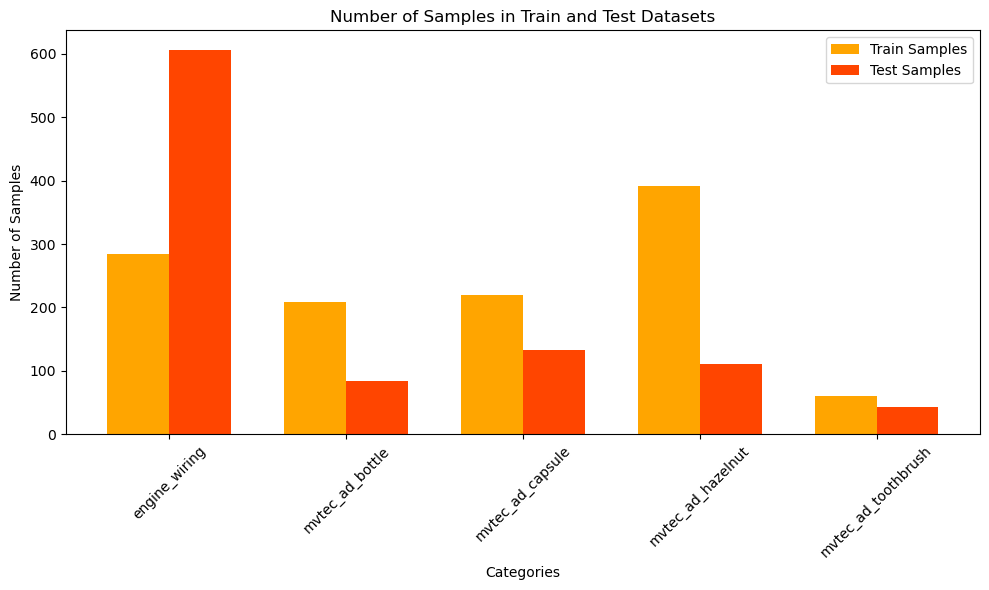

In [7]:
# Extract and print number of samples for each dataset
train_samples = {key: len(loader.dataset) for key, loader in train_loaders.items()}
test_samples = {key: len(loader.dataset) for key, loader in test_loaders.items()}

# Print sample counts
[print(f"{key}: {samples} samples in train") for key, samples in train_samples.items()]
[print(f"{key}: {samples} samples in test") for key, samples in test_samples.items()]

# Plot configuration
fig, ax = plt.subplots(figsize=(10, 6))
categories = list(train_samples.keys())  # Dataset categories
bar_width = 0.35

# Define bar positions
train_pos = range(len(categories))
test_pos = [pos + bar_width for pos in train_pos]

# Plot train and test sample counts
ax.bar(train_pos, train_samples.values(), width=bar_width, label='Train Samples', color='orange')
ax.bar(test_pos, test_samples.values(), width=bar_width, label='Test Samples', color='orangered')

# Configure labels and title
ax.set_xlabel('Categories')
ax.set_ylabel('Number of Samples')
ax.set_title('Number of Samples in Train and Test Datasets')
ax.set_xticks([pos + bar_width / 2 for pos in train_pos])  # Center xticks
ax.set_xticklabels(categories, rotation=45)
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()

### **1.3.2. Class Distribution in Test Dataset**
This function focuses on the test dataset:
  1. Counts the number of samples for each class.
  2. Displays a bar chart to illustrate the class distribution within the test dataset.
  3. For each class, one sample image is displayed to provide a quick overview of the dataset content.

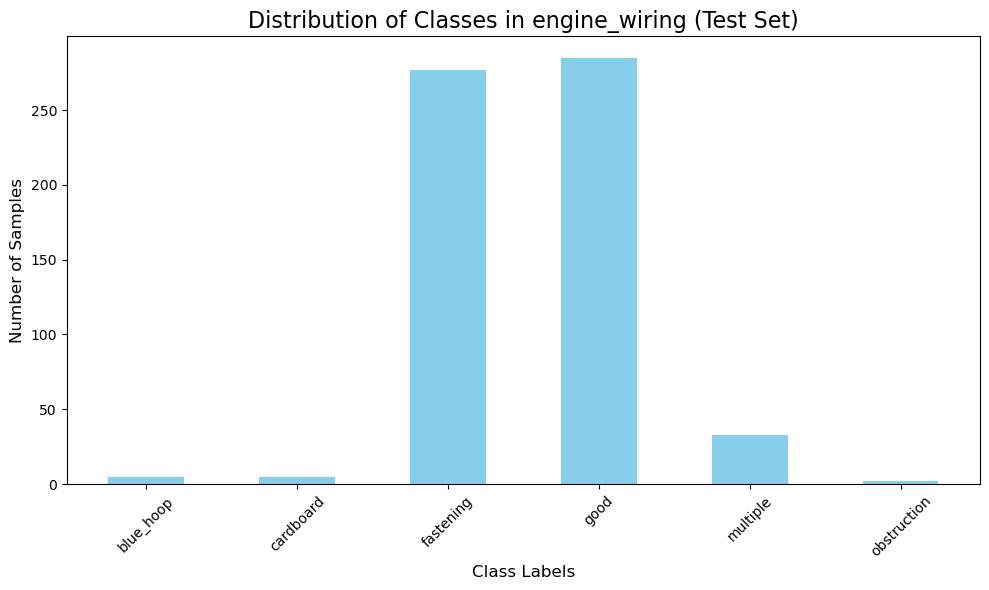

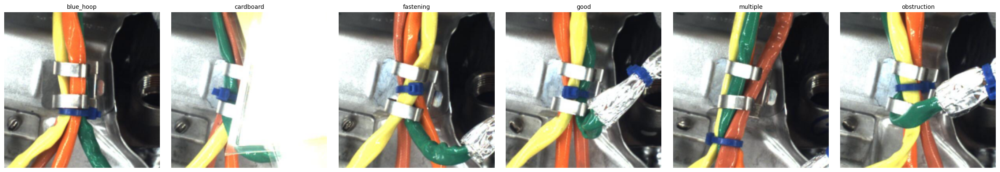

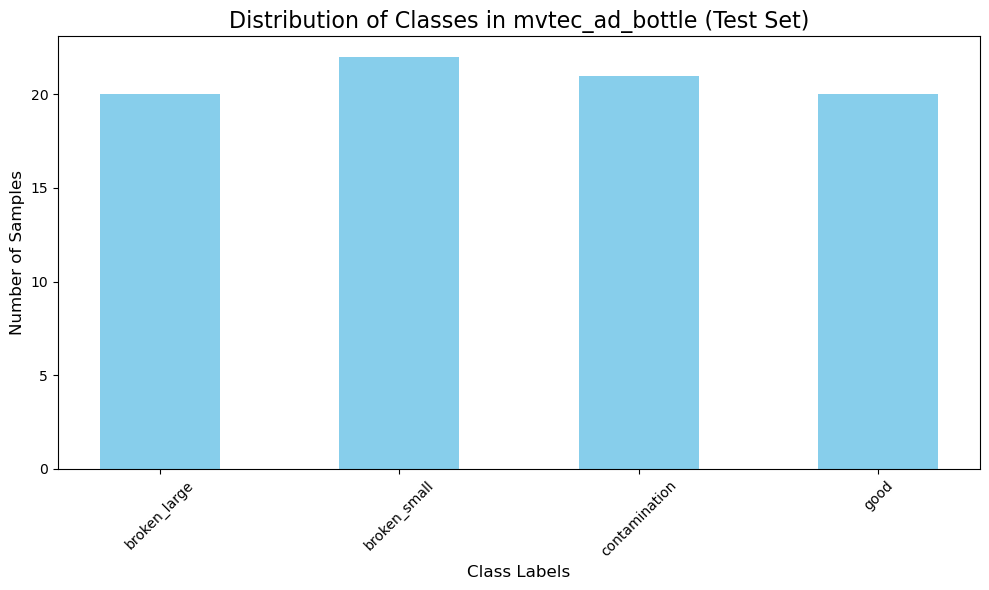

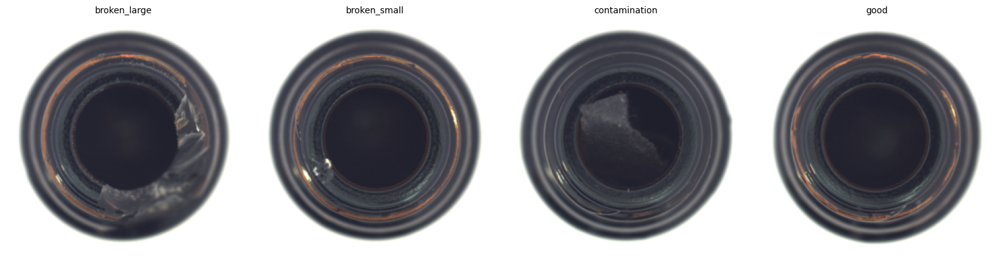

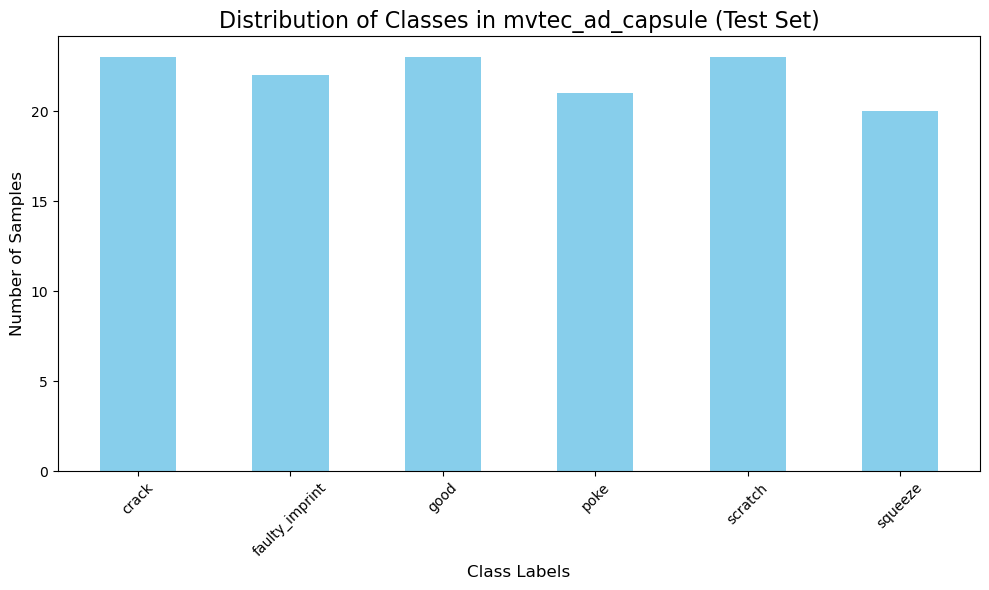

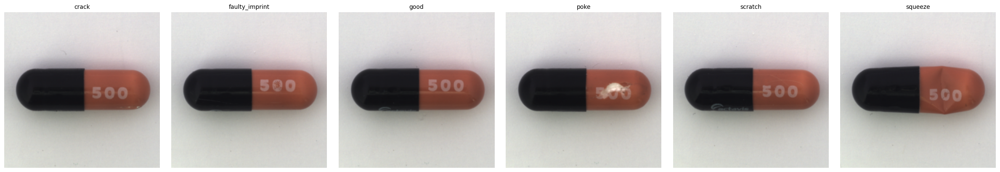

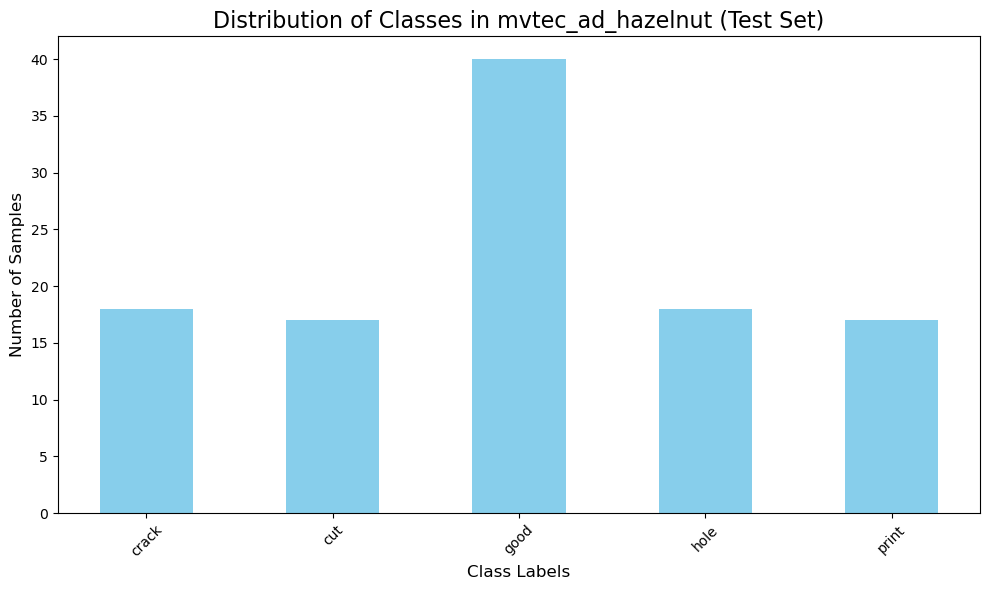

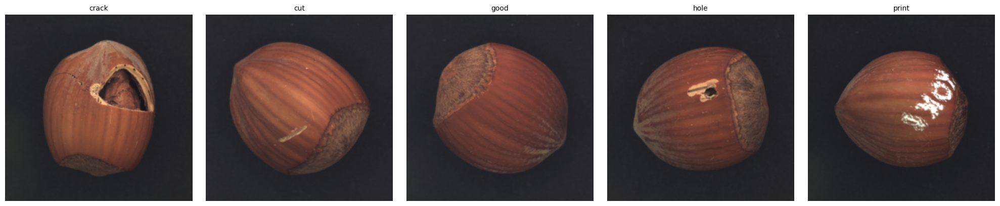

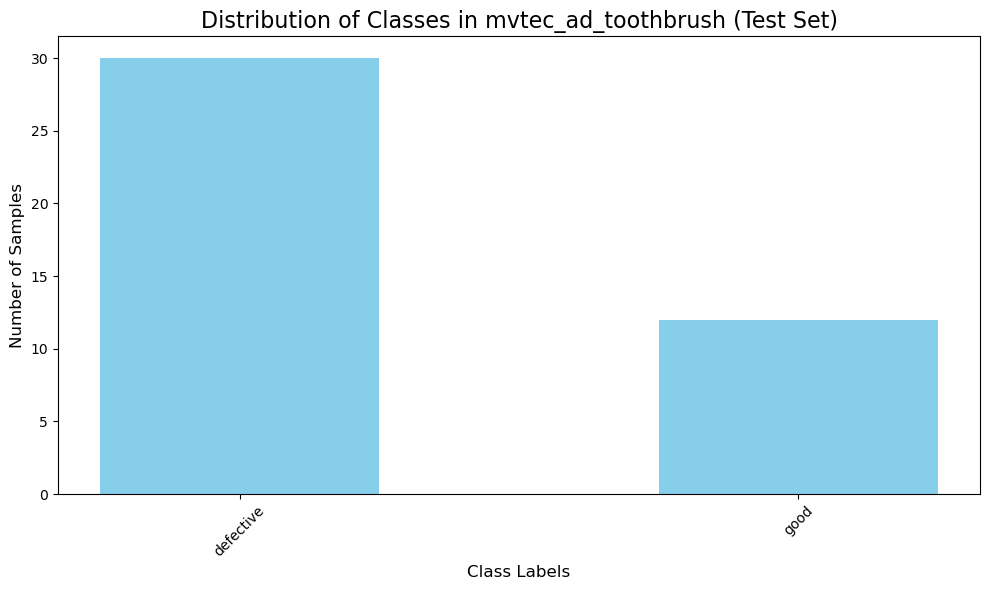

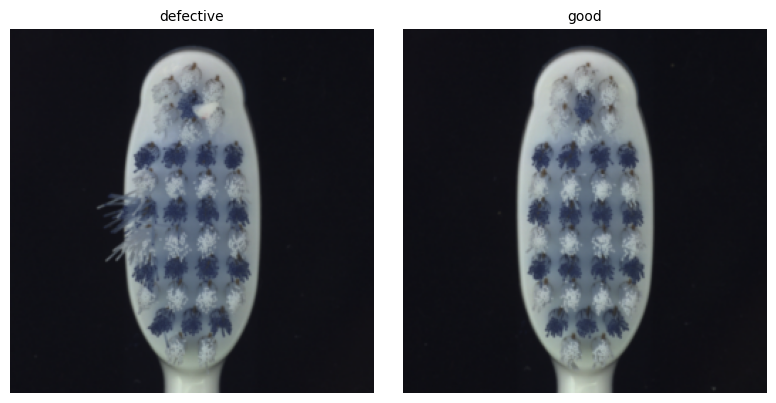

In [8]:
def visualize_test_loader(loader, title):
    # Extract dataset information
    class_names = loader.dataset.classes  # Class labels
    class_counts = np.zeros(len(class_names), dtype=int)  # Initialize counts

    # Count samples per class
    for _, labels in loader:
        for label in labels:
            class_counts[label] += 1

    # Plot class distribution
    plt.figure(figsize=(10, 6))
    plt.bar(class_names, class_counts, color='skyblue', width=0.5)
    plt.title(f"Distribution of Classes in {title} (Test Set)", fontsize=16)
    plt.xlabel("Class Labels", fontsize=12)
    plt.ylabel("Number of Samples", fontsize=12)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # Display one sample image per class
    _, axes = plt.subplots(1, len(class_names), figsize=(4 * len(class_names), 4))
    for i, class_name in enumerate(class_names):
        for images, labels in loader:
            idx = (labels == i).nonzero(as_tuple=True)[0]
            if len(idx) > 0:
                axes[i].imshow(images[idx[0]].permute(1, 2, 0))
                axes[i].axis('off')
                axes[i].set_title(f'{class_name}', fontsize=10)
                break
    plt.tight_layout()
    plt.show()

# Visualize each test loader
for key, loader in test_loaders.items():
    visualize_test_loader(loader, title=key)

## **1.4. Merging Anomaly Classes**


In anomaly detection (AD), all classes other than `good` are treated as anomalies. To simplify the problem, we group all these anomaly classes into a single `anomaly` class. This results in a binary classification task with two labels: `good` (label `0`) and `anomaly` (label `1`).

### **Steps Involved**:
1. **Custom Dataset Wrapper**:
   - A `AnomalyWrapperDataset` class is created to reassign labels:
     - `good` → `0`
     - All other classes → `1`

2. **Test Loaders Update**:
   - The new test loaders now only have two labels (`good` and `anomaly`) for each dataset.

3. **Visualization**:
   - A stacked bar chart is used to display the distribution of images across the `Train`, `Test - Good`, and `Test - Anomaly` sets.
   - This chart provides an overview of the dataset distribution after merging the anomaly classes.

In [9]:
# Custom Test Dataset to merge labels
class AnomalyWrapperDataset(Dataset):
    def __init__(self, dataset):
        self.dataset = dataset
        self.class_to_idx = {"good": 0, "anomaly": 1}

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        image, label = self.dataset[idx]
        # Convert label: good -> 0, others -> 1
        label = 0 if self.dataset.classes[label] == "good" else 1
        return image, label

# Load combined dataset with anomaly merging
train_loaders, test_loaders = load_datasets(
    root_directories, batch_size=BATCH_SIZE, merge_anomaly=True
)

In [10]:
# Extract and count samples
test_good_samples = {}
test_anomaly_samples = {}

# Count "good" and "anomaly" in test loaders
for key, loader in test_loaders.items():
    label_counter = Counter()
    for _, labels in loader:
        label_counter.update(labels.tolist())
    test_good_samples[key] = label_counter[0]
    test_anomaly_samples[key] = label_counter[1]

# Print sample counts
for key, samples in train_samples.items():
    print(f"{key}: {samples} samples in train")

for key in test_good_samples:
    print(f"{key}: {test_good_samples[key]} good samples, {test_anomaly_samples[key]} anomaly samples in test")

engine_wiring: 285 samples in train
mvtec_ad_bottle: 209 samples in train
mvtec_ad_capsule: 219 samples in train
mvtec_ad_hazelnut: 391 samples in train
mvtec_ad_toothbrush: 60 samples in train
engine_wiring: 285 good samples, 322 anomaly samples in test
mvtec_ad_bottle: 20 good samples, 63 anomaly samples in test
mvtec_ad_capsule: 23 good samples, 109 anomaly samples in test
mvtec_ad_hazelnut: 40 good samples, 70 anomaly samples in test
mvtec_ad_toothbrush: 12 good samples, 30 anomaly samples in test


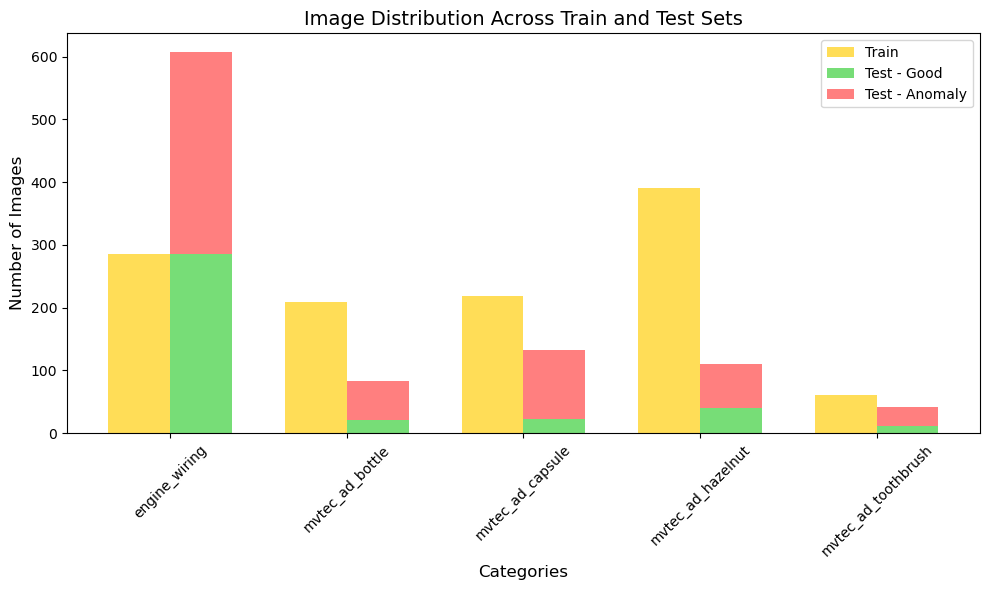

In [11]:
# Plot configuration
fig, ax = plt.subplots(figsize=(10, 6))
categories = list(train_samples.keys())
bar_width = 0.35
x = np.arange(len(categories))

# Light color palette
train_color = '#FFDD57'  # Light Yellow
good_color = '#77DD77'  # Light Green
anomaly_color = '#FF7F7F'  # Light Red

# Plot Train samples
ax.bar(x - bar_width / 2, train_samples.values(), width=bar_width, label='Train', color=train_color)

# Plot Test - Good (bottom of stacked bar)
ax.bar(x + bar_width / 2, test_good_samples.values(), width=bar_width, label='Test - Good', color=good_color)

# Plot Test - Good (stacked on top of anomaly)
ax.bar(x + bar_width / 2, test_anomaly_samples.values(), width=bar_width, label='Test - Anomaly', color=anomaly_color,
       bottom=list(test_good_samples.values()))

# Configure labels, title, and legend
ax.set_xlabel('Categories', fontsize=12)
ax.set_ylabel('Number of Images', fontsize=12)
ax.set_title('Image Distribution Across Train and Test Sets', fontsize=14)
ax.set_xticks(x)
ax.set_xticklabels(categories, rotation=45)
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()

# **2. Models' implementation**

## **2.1. Shared architectures**

### **2.1.1. Traditional AutoEncoder**

he first architecture defined for pretext tasks is an **AutoEncoder**, which is a common structure used to reconstruct input data. This architecture was previously used in practical sessions (TP) and has been enhanced by adding `BatchNorm2d` layers to improve training stability.

#### **Architecture Overview**:
1. **Encoder**:
   - Reduces the input data dimensionality using a series of convolutional layers.
   - Each convolutional layer is followed by:
     - A `BatchNorm2d` layer for normalization.
     - An activation function ReLU for non-linearity.

2. **Decoder**:
   - Reconstructs the original input from the encoded representation.
   - Uses transposed convolutional layers for upsampling.

#### **Why Add BatchNorm?**
`BatchNorm2d` (Batch Normalization for 2D inputs) is added to stabilize and accelerate training. It works by normalizing the intermediate feature maps across a batch of samples, ensuring that:
- The mean of the outputs is close to 0.
- The standard deviation of the outputs is close to 1.

**Key Benefits**:
1. **Stabilizes Training**:
   - Prevents extreme activation values, reducing the risk of exploding or vanishing gradients.
2. **Improves Generalization**:
   - Adds a slight regularization effect by introducing noise during training, improving model performance on unseen data.
3. **Speeds Up Training**:
   - Allows the model to use higher learning rates, resulting in faster convergence.

#### **Why AutoEncoder?**
- **Reconstruction Loss**: Measures how well the model can recreate the input, with higher reconstruction errors potentially indicating anomalies.
- **Pretext Task**: Pretraining the model on this task helps it learn meaningful representations of the data.

In [12]:
class Encoder(nn.Module):
    def __init__(self, in_channels=3, latent_dim=128):
        super(Encoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=4, stride=2, padding=1),  # 256x256 -> 128x128
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # 128x128 -> 64x64
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),  # 64x64 -> 32x32
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, latent_dim, kernel_size=4, stride=2, padding=1),  # 32x32 -> 16x16
            nn.BatchNorm2d(latent_dim),
            nn.ReLU(),
        )

    def forward(self, x):
        return self.encoder(x)

class Decoder(nn.Module):
    def __init__(self, latent_dim=128, out_channels=3):
        super(Decoder, self).__init__()
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 256, kernel_size=4, stride=2, padding=1),  # 16x16 -> 32x32
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # 32x32 -> 64x64
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # 64x64 -> 128x128
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, out_channels, kernel_size=4, stride=2, padding=1),  # 128x128 -> 256x256
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.decoder(x)

### **2.1.2. AutoEncoder with Attention Mechanism**

In this architecture, both the **Encoder** and **Decoder** are enhanced with the **Attention Mechanism**. This addition allows the model to focus on the most relevant regions of the image during encoding and decoding.

#### **Attention Block**:
- Consists of a **Squeeze-and-Excitation** operation:
     - Compresses feature maps to focus on key channels (using `Conv2d`).
     - Reweights channels using a `Sigmoid` activation.

- Outputs an attention map, which is element-wise multiplied with the input features to emphasize important regions.

#### **Attention in Encoder**:
- The encoder compresses the input into a latent representation while preserving important features.
- Attention blocks are added after each convolutional layer to emphasize relevant regions in the input data.
- The attention mechanism dynamically adjusts focus at each layer, making the feature extraction process more robust.

#### **Attention in Decoder**:
- The decoder reconstructs the input image from the latent representation.
- Attention blocks are incorporated after each transposed convolutional layer.
- This helps the model focus on reconstructing fine-grained details and recovering the most relevant spatial information.



In [13]:
# Attention Mechanism
class AttentionBlock(nn.Module):
    def __init__(self, channels):
        super(AttentionBlock, self).__init__()
        self.attention = nn.Sequential(
            nn.Conv2d(channels, channels // 8, kernel_size=1),  # Squeeze
            nn.BatchNorm2d(channels // 8),  # Add BatchNorm
            nn.ReLU(),
            nn.Conv2d(channels // 8, channels, kernel_size=1),  # Excitation
            nn.BatchNorm2d(channels),  # Add BatchNorm
            nn.Sigmoid(),
        )

    def forward(self, x):
        attn = self.attention(x)
        return x * attn

# Encoder with Attention
class AttentionEncoder(nn.Module):
    def __init__(self, in_channels=3, latent_dim=128):
        super(AttentionEncoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=4, stride=2, padding=1),  # 256x256 -> 128x128
            nn.ReLU(),
            AttentionBlock(64),  # Attention
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # 128x128 -> 64x64
            nn.ReLU(),
            AttentionBlock(128),  # Attention
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),  # 64x64 -> 32x32
            nn.ReLU(),
            AttentionBlock(256),  # Attention
            nn.Conv2d(256, latent_dim, kernel_size=4, stride=2, padding=1),  # 32x32 -> 16x16
            nn.ReLU(),
        )

    def forward(self, x):
        return self.encoder(x)

# Decoder with Attention
class AttentionDecoder(nn.Module):
    def __init__(self, latent_dim=128, out_channels=3):
        super(AttentionDecoder, self).__init__()
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 256, kernel_size=4, stride=2, padding=1),  # 16x16 -> 32x32
            nn.ReLU(),
            AttentionBlock(256),  # Attention
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # 32x32 -> 64x64
            nn.ReLU(),
            AttentionBlock(128),  # Attention
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # 64x64 -> 128x128
            nn.ReLU(),
            AttentionBlock(64),  # Attention
            nn.ConvTranspose2d(64, out_channels, kernel_size=4, stride=2, padding=1),  # 128x128 -> 256x256
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.decoder(x)

### **2.1.3. U-Net AutoEncoder**

#### **U-Net Overview**:
- U-Net is a popular architecture originally designed for biomedical image segmentation. In this context, it is adapted as an AutoEncoder for anomaly detection tasks.

#### **Advantages of U-Net**:
- **Preservation of Detail**:
  - Skip connections ensure that low-level details from the input are not lost during the encoding process.
- **Effective for Anomaly Detection**:
  - By retaining spatial information, U-Net excels in reconstructing high-resolution images, making it highly suitable for visual anomaly detection tasks.

#### **Reference**:
- Inspired by: [Reconstruction by inpainting for visual anomaly detection](https://www.sciencedirect.com/science/article/abs/pii/S0031320320305094)

In [14]:
# Taken and modified from https://github.com/taikiinoue45/RIAD/blob/main/riad/models/unet.py

# Convolutional block
def conv_block(in_channels, out_channels):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True),
        nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True),
    )

# Upsampling block
def upconv_block(in_channels, out_channels):
    return nn.Sequential(
        nn.ConvTranspose2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1),
        nn.ReLU(inplace=True),
    )

# Encoder
class UNetEncoder(nn.Module):
    def __init__(self, in_channels=3, latent_dim=512):
        super(UNetEncoder, self).__init__()
        self.enc1 = conv_block(in_channels, 64)
        self.enc2 = conv_block(64, 128)
        self.enc3 = conv_block(128, 256)
        self.bottleneck = conv_block(256, latent_dim)

    def forward(self, x):
        x1 = self.enc1(x)  # 64
        x2 = self.enc2(F.max_pool2d(x1, 2))  # 128
        x3 = self.enc3(F.max_pool2d(x2, 2))  # 256
        bottleneck = self.bottleneck(F.max_pool2d(x3, 2))  # latent_dim
        return bottleneck, [x1, x2, x3]

# Decoder
class UNetDecoder(nn.Module):
    def __init__(self, latent_dim=512, out_channels=3):
        super(UNetDecoder, self).__init__()
        self.up3 = upconv_block(latent_dim, 256)
        self.dec3 = conv_block(512, 256)  # Skip connection: 256 + 256

        self.up2 = upconv_block(256, 128)
        self.dec2 = conv_block(256, 128)  # Skip connection: 128 + 128

        self.up1 = upconv_block(128, 64)
        self.dec1 = conv_block(128, 64)  # Skip connection: 64 + 64

        self.final_conv = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, bottleneck, skip_connections):
        x1, x2, x3 = skip_connections

        x = self.up3(bottleneck)  # 256
        x = self.dec3(torch.cat([x, x3], dim=1))  # 256 + 256 -> 256

        x = self.up2(x)  # 128
        x = self.dec2(torch.cat([x, x2], dim=1))  # 128 + 128 -> 128

        x = self.up1(x)  # 64
        x = self.dec1(torch.cat([x, x1], dim=1))  # 64 + 64 -> 64

        x = self.final_conv(x)
        return torch.sigmoid(x)  # Output in range [0, 1]

## **2.2. Pretext Tasks and Models**

We implement models for the following three **pretext tasks**, each designed to learn meaningful representations from unlabeled data. Each task involves three architectures (AutoEncoder, Encoder-Decoder with Attention, and U-Net), resulting in a total of 9 models.

### **2.2.1. Colorization**
- **Task**:
  - Convert a grayscale image to its RGB equivalent.
- **Purpose**:
  - Encourage the model to understand spatial and semantic relationships in the image.
- **Hyperparameters**:
  - **Latent Dimension (`latent_dim`)**: Size of the encoded representation.
  - **Learning Rate**: Affects training speed and convergence.

In [15]:
class ColorizationModel(nn.Module):
    def __init__(self, latent_dim=128):
        super(ColorizationModel, self).__init__()
        self.encoder = Encoder(latent_dim=latent_dim, in_channels=1)  # Input grayscale
        self.decoder = Decoder(latent_dim=latent_dim, out_channels=3)  # Predict RGB

    def forward(self, x):
        grayscale_x = transforms.Grayscale()(x)  # Convert RGB to Grayscale
        z = self.encoder(grayscale_x)
        return self.decoder(z), grayscale_x  # Decode to RGB and return grayscale

In [16]:
class AttentionColorizationModel(nn.Module):
    def __init__(self, latent_dim=128):
        super(AttentionColorizationModel, self).__init__()
        self.encoder = AttentionEncoder(latent_dim=latent_dim, in_channels=1)  # Input grayscale
        self.decoder = AttentionDecoder(latent_dim=latent_dim, out_channels=3)  # Predict RGB

    def forward(self, x):
        grayscale_x = transforms.Grayscale()(x)  # Convert RGB to Grayscale
        z = self.encoder(grayscale_x)  # Attention-based Encoder
        return self.decoder(z), grayscale_x  # Decode to RGB and return grayscale

In [17]:
class UNetColorizationModel(nn.Module):
    def __init__(self, latent_dim=512):
        super(UNetColorizationModel, self).__init__()
        self.encoder = UNetEncoder(in_channels=1, latent_dim=latent_dim)  # Input grayscale
        self.decoder = UNetDecoder(latent_dim=latent_dim, out_channels=3)  # Predict RGB

    def forward(self, x):
        # Convert RGB input to grayscale
        grayscale_x = transforms.Grayscale()(x)  # Convert RGB to Grayscale

        # Pass through Encoder and Decoder
        bottleneck, skip_connections = self.encoder(grayscale_x)
        output = self.decoder(bottleneck, skip_connections)

        return output, grayscale_x  # Return reconstructed RGB and input grayscale

### **2.2.2. Inpainting**
- **Task**:
  - Predict missing regions of an image masked during preprocessing.
- **Purpose**:
  - Train the model to understand and reconstruct missing parts, making it adept at feature representation.
- **Key Parameters**:
  - **Mask Size (`mask_size`)**: Size of the rectangular regions to be masked.
  - **Latent Dimension (`latent_dim`)**: Size of the encoded representation.
  - **Learning Rate**: Affects training speed and convergence.

In [18]:
class InpaintingModel(nn.Module):
    def __init__(self, latent_dim=128, mask_size=8):
        super(InpaintingModel, self).__init__()
        self.encoder = Encoder(latent_dim=latent_dim)
        self.decoder = Decoder(latent_dim=latent_dim)
        self.mask_size = mask_size

    def forward(self, x):
        x_masked = self.apply_mask(x)  # Apply mask to input
        z = self.encoder(x_masked)  # Encode masked input
        output = self.decoder(z)  # Decode latent representation
        return output, x_masked

    def apply_mask(self, x):
        masked_x = x.clone()

        for i in range(masked_x.size(0)):
            ul_x = np.random.randint(0, x.size(2) - self.mask_size + 1)
            ul_y = np.random.randint(0, x.size(3) - self.mask_size + 1)
            masked_x[i, :, ul_x:ul_x+self.mask_size, ul_y:ul_y+self.mask_size] = 0

        return masked_x

In [19]:
class AttentionInpaintingModel(nn.Module):
    def __init__(self, latent_dim=128, mask_size=8):
        super(AttentionInpaintingModel, self).__init__()
        self.encoder = AttentionEncoder(latent_dim=latent_dim, in_channels=3)
        self.decoder = AttentionDecoder(latent_dim=latent_dim, out_channels=3)
        self.mask_size = mask_size

    def forward(self, x):
        x_masked = self.apply_mask(x)  # Apply mask to input
        z = self.encoder(x_masked)  # Encode masked input
        output = self.decoder(z)  # Decode latent representation
        return output, x_masked

    def apply_mask(self, x):
        masked_x = x.clone()

        for i in range(masked_x.size(0)):
            ul_x = np.random.randint(0, x.size(2) - self.mask_size + 1)
            ul_y = np.random.randint(0, x.size(3) - self.mask_size + 1)
            masked_x[i, :, ul_x:ul_x+self.mask_size, ul_y:ul_y+self.mask_size] = 0

        return masked_x

In [20]:
class UNetInpaintingModel(nn.Module):
    def __init__(self, latent_dim=512, mask_size=8):
        super(UNetInpaintingModel, self).__init__()
        self.encoder = UNetEncoder(in_channels=3, latent_dim=latent_dim)
        self.decoder = UNetDecoder(latent_dim=latent_dim, out_channels=3)
        self.mask_size = mask_size

    def forward(self, x):
        x_masked = self.apply_mask(x)  # Apply mask to input
        bottleneck, skip_connections = self.encoder(x_masked)  # Pass through Encoder
        output = self.decoder(bottleneck, skip_connections)  # Pass through Decoder
        return output, x_masked  # Return inpainted output and masked input

    def apply_mask(self, x):
        masked_x = x.clone()

        for i in range(masked_x.size(0)):  # Loop through the batch
            ul_x = np.random.randint(0, x.size(2) - self.mask_size + 1)
            ul_y = np.random.randint(0, x.size(3) - self.mask_size + 1)
            masked_x[i, :, ul_x:ul_x + self.mask_size, ul_y:ul_y + self.mask_size] = 0
        return masked_x

### **2.2.3. Masked AutoEncoder**
- **Task**:
  - Mask random patches of the input image and reconstruct the entire image.
- **Purpose**:
  - Learn robust representations by predicting masked areas based on visible regions.
- **Hyperparameters**:
  - **Mask Ratio (`mask_ratio`)**: Fraction of the image to be masked.
  - **Latent Dimension (`latent_dim`)**: Size of the encoded representation.
  - **Learning Rate**: Affects training speed and convergence.

In [21]:
class MaskedAutoencoderModel(nn.Module):
    def __init__(self, latent_dim=128, mask_ratio=1/16):
        super(MaskedAutoencoderModel, self).__init__()
        self.encoder = Encoder(latent_dim=latent_dim)
        self.decoder = Decoder(latent_dim=latent_dim)
        self.mask_ratio = mask_ratio

    def forward(self, x):
        x_masked = self.apply_mask(x)
        z = self.encoder(x_masked)
        return self.decoder(z), x_masked

    def apply_mask(self, x):
        x_masked = x.clone()
        mask = torch.rand_like(x[:, 0, :, :]) < self.mask_ratio
        mask = mask.unsqueeze(1).repeat(1, x.size(1), 1, 1)
        x_masked[mask] = 0
        return x_masked

In [22]:
class AttentionMaskedAutoencoderModel(nn.Module):
    def __init__(self, latent_dim=128, mask_ratio=1/16):
        super(AttentionMaskedAutoencoderModel, self).__init__()
        self.encoder = AttentionEncoder(in_channels=3, latent_dim=latent_dim)
        self.decoder = AttentionDecoder(latent_dim=latent_dim, out_channels=3)
        self.mask_ratio = mask_ratio

    def forward(self, x):
        x_masked = self.apply_mask(x)  # Apply mask to input
        z = self.encoder(x_masked)  # Encode masked input
        output = self.decoder(z)  # Decode latent representation
        return output, x_masked

    def apply_mask(self, x):
        x_masked = x.clone()
        mask = torch.rand_like(x[:, 0, :, :]) < self.mask_ratio
        mask = mask.unsqueeze(1).repeat(1, x.size(1), 1, 1)
        x_masked[mask] = 0
        return x_masked

In [23]:
class UNetMaskedAutoencoderModel(nn.Module):
    def __init__(self, latent_dim=512, mask_ratio=1/16):
        super(UNetMaskedAutoencoderModel, self).__init__()
        self.encoder = UNetEncoder(in_channels=3, latent_dim=latent_dim)
        self.decoder = UNetDecoder(latent_dim=latent_dim, out_channels=3)
        self.mask_ratio = mask_ratio

    def forward(self, x):
        x_masked = self.apply_mask(x)  # Apply mask to input
        bottleneck, skip_connections = self.encoder(x_masked)  # Pass through Encoder
        output = self.decoder(bottleneck, skip_connections)  # Pass through Decoder
        return output, x_masked

    def apply_mask(self, x):
        x_masked = x.clone()
        mask = torch.rand_like(x[:, 0, :, :]) < self.mask_ratio
        mask = mask.unsqueeze(1).repeat(1, x.size(1), 1, 1)
        x_masked[mask] = 0
        return x_masked

# **3. Models' training**

##### In this section, we focus on training the 9 models across the 3 pretext tasks and 5 datasets. The goal is to optimize each model to effectively learn meaningful representations from the datasets provided.

In [24]:
def train_ssl_model(model, train_loader, test_loader, criterion, optimizer, device=device, epochs=5, progress=False):
    """
    Train a self-supervised learning (SSL) model with a learning rate scheduler.
    """

    train_losses = []  # Store training losses for visualization
    val_losses = []    # Store validation losses for visualization

    model.to(device)

    # Reduce learning rate when validation loss plateaus
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)

    for epoch in range(epochs):
        model.train()  # Set model to training mode
        total_train_loss = 0

        # Training loop
        for images, _ in train_loader:
            images = images.to(device)

            optimizer.zero_grad()
            output, _ = model(images)
            loss = criterion(output, images)
            loss.backward()
            optimizer.step()

            total_train_loss += loss.item()

        avg_train_loss = total_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # Validation loop (no gradient calculation)
        model.eval()  # Set model to evaluation mode
        total_val_loss = 0
        with torch.no_grad():
            for images, _ in test_loader:
                images = images.to(device)
                output, _ = model(images)
                loss = criterion(output, images)
                total_val_loss += loss.item()

        avg_val_loss = total_val_loss / len(test_loader)
        val_losses.append(avg_val_loss)

        # Adjust learning rate based on validation loss
        scheduler.step(avg_val_loss)

        # Log current learning rate for monitoring
        current_lr = scheduler.optimizer.param_groups[0]['lr']

        if progress:
            print(f"Epoch {epoch+1}/{epochs}, Train Loss: {avg_train_loss:.6f}, "
                  f"Val Loss: {avg_val_loss:.6f}, LR: {current_lr:.6f}")

    return model.encoder, train_losses, val_losses

## **3.1. Hyperparameter  Tuning**

### **3.1.1. Custom Learning Rate Finder**


#### **Introduction**:
The `find_learning_rate` function is a custom function designed to identify the optimal learning rate for a model. It is inspired by the paper *[Cyclical Learning Rates for Training Neural Networks](https://arxiv.org/abs/1506.01186)* by Leslie N. Smith and replicates the functionality of the [`torch_lr_finder`](https://github.com/davidtvs/pytorch-lr-finder/blob/master/torch_lr_finder) library with greater flexibility and no external dependencies.

#### **How It Works**:
1. **Gradual Learning Rate Increase**:
   - Starts with a very small learning rate (e.g., `1e-6`) and increases it exponentially over a range.
2. **Loss Recording**:
   - Tracks the loss at each step along with the corresponding learning rate.
3. **Optimal Learning Rate Selection**:
   - The optimal learning rate is identified as the point of steepest loss decrease on the loss vs. learning rate curve. A small adjustment (dividing by 10) ensures stability during training.

#### **References**:
- **Paper**: *[Cyclical Learning Rates for Training Neural Networks](https://arxiv.org/abs/1506.01186)* by Leslie N. Smith.
- **Library**: Inspired by the `torch_lr_finder` library.

In [25]:
# Function to find optimal learning rate
def find_learning_rate(model, train_loader, criterion, optimizer, device, end_lr=1, plot = False):
    """
    Custom learning rate finder for neural networks.
    """
    model.train()
    lr_list, loss_list = [], []
    lr = 1e-6  # Start with a very small learning rate

    num_iter = min(20, len(train_loader))
    factor = (end_lr / lr) ** (1 / num_iter)  # Multiplicative factor to increase LR

    optimizer.param_groups[0]['lr'] = lr
    for i, (images, _) in enumerate(train_loader):
        if i >= num_iter:  # Stop after num_iter iterations
            break
        images = images.to(device)
        optimizer.zero_grad()
        output, _ = model(images)
        loss = criterion(output, images)

        # Stop if loss explodes
        if loss.item() > 10 * loss_list[0] if len(loss_list) > 0 else False:
            print("Loss is exploding, stopping early...")
            break

        loss.backward()
        optimizer.step()

        # Log learning rate and loss
        lr_list.append(lr)
        loss_list.append(loss.item())
        #print(f"Iteration {i+1}/{num_iter}: LR = {lr:.8f}, Loss = {loss.item():.4f}")

        # Update LR
        lr *= factor
        optimizer.param_groups[0]['lr'] = lr

    if plot:
        # Plot LR vs Loss
        plt.plot(lr_list, loss_list)
        plt.xlabel("Learning Rate")
        plt.ylabel("Loss")
        plt.xscale("log")
        plt.title("Learning Rate Finder")
        plt.show()

    # Return learning rate with minimum loss (divided by 10 for stability)
    optimal_lr = lr_list[np.argmin(loss_list)] / 10
    # print(f"Optimal Learning Rate: {optimal_lr:.8f}")
    return optimal_lr

### **3.1.2. Random Search for Hyperparameter Tuning**

#### **Why Random Search?**
- **Efficiency**: Random Search evaluates a subset of hyperparameter combinations, saving computational resources compared to Grid Search, especially in high-dimensional spaces.
- **Better Coverage**: Random sampling explores diverse regions of the search space, increasing the likelihood of finding optimal configurations.
- **Continuous Parameters**: Handles continuous hyperparameters (e.g., `mask_ratio`) more naturally than Grid Search.

#### **Workflow**:
1. Use **Learning Rate Finder** to determine the optimal learning rate for each trial.
2. Randomly sample:
   - **Latent Dimension**: From a predefined set (e.g., `[64, 128, 256]`).
   - **Mask Size** (Inpainting): From discrete values (e.g., `[8, 16, 32]`).
   - **Mask Ratio** (Masked AutoEncoder): From a continuous range (e.g., `[1/16, 1/4]`).
3. Train the model and evaluate performance based on validation loss.
4. Select the best configuration from multiple trials.

In [26]:
# Random Search combined with LR Finder
def random_search_with_lr_finder(model_class, train_loader, test_loader, criterion, device,
                                 latent_dims, num_trials=5, epochs=5, task_type="colorization"):
    """
    Perform Random Search for hyperparameters while using Learning Rate Finder to determine optimal LR.
    """
    results = []

    for trial in range(1, num_trials + 1):
        # Randomly select hyperparameters
        latent_dim = random.choice(latent_dims)
        mask_size = random.choice([8, 16, 32]) if task_type == "inpainting" else None
        mask_ratio = random.uniform(1/16, 1/4) if task_type == "masked_autoencoder" else None

        # print(f"Trial {trial}/{num_trials}: latent_dim = {latent_dim}, mask_size = {mask_size}, mask_ratio = {mask_ratio}")

        # Initialize model based on task
        if task_type == "colorization":
            model = model_class(latent_dim=latent_dim).to(device)
        elif task_type == "inpainting":
            model = model_class(latent_dim=latent_dim, mask_size=mask_size).to(device)
        elif task_type == "masked_autoencoder":
            model = model_class(latent_dim=latent_dim, mask_ratio=mask_ratio).to(device)
        else:
            raise ValueError("Unsupported task_type. Choose from 'colorization', 'inpainting', 'masked_autoencoder'.")

        optimizer = optim.Adam(model.parameters(), lr=1e-3)  # Temporary LR for LR Finder

        # Find optimal learning rate
        # print("Finding optimal learning rate...")
        optimal_lr = find_learning_rate(model, train_loader, criterion, optimizer, device)

        # Reinitialize optimizer with optimal LR
        optimizer = optim.Adam(model.parameters(), lr=optimal_lr)

        # Train the model
        _, _, val_losses = train_ssl_model(model, train_loader, test_loader, criterion, optimizer, device, epochs)
        final_val_loss = val_losses[-1]

        # Log results
        results.append({
            "lr": optimal_lr,
            "latent_dim": latent_dim,
            "mask_size": mask_size,
            "mask_ratio": mask_ratio,
            "val_loss": final_val_loss
        })

        # print(f"Trial {trial}: Val Loss = {final_val_loss:.4f}\n")

    # Find the best trial
    best_trial = sorted(results, key=lambda x: x["val_loss"])[0]
    print("Best Trial:")
    print(f"LR: {best_trial['lr']:.6f}, latent_dim: {best_trial['latent_dim']}, "
          f"mask_size: {best_trial['mask_size']}, mask_ratio: {best_trial['mask_ratio']:.6f}, "
          f"Val Loss: {best_trial['val_loss']:.6f}")
    return best_trial

### **3.1.3. Splitting Test Set into Validation and Final Test Sets**


##### **Why Split the Test Set?**
1. **Avoid Overfitting and Data Leakage**:
   - Using the test set to tune hyperparameters risks overfitting and data leakage.
   - It compromises the reliability of final evaluation results.

2. **Proper Evaluation Pipeline**:
   - The **validation set** is used for hyperparameter tuning and intermediate evaluations.
   - The **final test set** is exclusively used to evaluate the model's generalization on unseen data.

##### **Implementation**:
The function `split_test_loader` divides the test set into two parts:
1. **Validation Set**:
   - Used during model development for fine-tuning and validation.
2. **Final Test Set**:
   - Used only once after the model is fully trained to evaluate its final performance.

##### **Benefits**:
- Ensures the model evaluation is unbiased and generalizes well.
- Maintains class balance across both subsets.

In [27]:
def split_test_loader(test_loaders, val_ratio=0.5, batch_size=BATCH_SIZE):
    """
    Split test_loaders into validation loaders and final test loaders.
    """
    val_loaders = {}
    final_test_loaders = {}

    for dataset_name, test_loader in test_loaders.items():
        # Step 1: Extract all data from the test loader
        all_images = []
        all_labels = []
        for images, labels in test_loader:
            all_images.append(images)
            all_labels.append(labels)

        # Combine all batches into single tensors
        all_images = torch.cat(all_images, dim=0)
        all_labels = torch.cat(all_labels, dim=0)

        # Step 2: Split data into validation and final test sets
        val_indices, test_indices = train_test_split(
            range(len(all_images)),
            test_size=(1 - val_ratio),  # Remaining part for final test set
            stratify=all_labels,        # Maintain class distribution
            random_state=42
        )

        # Step 3: Create Subset and DataLoader for validation and final test
        val_subset = Subset(list(zip(all_images, all_labels)), val_indices)
        test_subset = Subset(list(zip(all_images, all_labels)), test_indices)

        val_loaders[dataset_name] = DataLoader(val_subset, batch_size=batch_size, shuffle=True)
        final_test_loaders[dataset_name] = DataLoader(test_subset, batch_size=batch_size, shuffle=False)

        print(f"{dataset_name}: Validation samples = {len(val_subset)}, Test samples = {len(test_subset)}")

    return val_loaders, final_test_loaders

val_loaders, final_test_loaders = split_test_loader(test_loaders, val_ratio=0.5, batch_size=BATCH_SIZE)

engine_wiring: Validation samples = 303, Test samples = 304
mvtec_ad_bottle: Validation samples = 41, Test samples = 42
mvtec_ad_capsule: Validation samples = 66, Test samples = 66
mvtec_ad_hazelnut: Validation samples = 55, Test samples = 55
mvtec_ad_toothbrush: Validation samples = 21, Test samples = 21


### **3.1.4. Hyperparameter Search Implementation**

#### **Process**:
1. **For Each Dataset and Model**:
   - Perform **Random Search** with **Learning Rate Finder**.
   - Dynamically retrieve model classes.
   - Log results and clear GPU cache.
2. **Save Results**:
   - Results saved in `best_hyperparameters.csv`.


In [28]:
# Hyperparameter configurations
latent_dims = [64, 128, 256, 512]

# Models for tasks
tasks = {
    "colorization": ["ColorizationModel", "AttentionColorizationModel", "UNetColorizationModel"],
    "inpainting": ["InpaintingModel", "AttentionInpaintingModel", "UNetInpaintingModel"],
    "masked_autoencoder": ["MaskedAutoencoderModel", "AttentionMaskedAutoencoderModel", "UNetMaskedAutoencoderModel"]
}

# Dataset loaders
datasets = ["engine_wiring", "mvtec_ad_bottle", "mvtec_ad_capsule", "mvtec_ad_hazelnut", "mvtec_ad_toothbrush"]

# Define the directory to save the CSV file
results_dir = "results"
#results_dir = "/content/results"
os.makedirs(results_dir, exist_ok=True)
best_params_csv_path = os.path.join(results_dir, "best_hyperparameters.csv")

# Check if the .csv file already exists
if os.path.exists(best_params_csv_path):
    # Load the CSV file if it exists
    df_best_params = pd.read_csv(best_params_csv_path)
    print("CSV file already exists. Loaded into DataFrame:")
else:
    # If the file does not exist, perform hyperparameter search
    all_best_params = {}

    # Iterate through datasets and tasks
    for dataset_name in datasets:
        train_loader = train_loaders[dataset_name]
        test_loader = val_loaders[dataset_name]

        for task_name, model_list in tasks.items():
            for model_class_name in model_list:
                print(f"\n=== Dataset: {dataset_name}, Model: {model_class_name}, Task: {task_name} ===")

                # Dynamically retrieve the model class
                model_class = globals()[model_class_name]

                # Perform random search to find the best hyperparameters
                best_params = random_search_with_lr_finder(
                    model_class=model_class,
                    train_loader=train_loader,
                    test_loader=test_loader,
                    criterion=nn.MSELoss(),
                    device=device,
                    latent_dims=latent_dims,
                    num_trials=10,
                    epochs=5,
                    task_type=task_name,
                )
                torch.cuda.empty_cache()  # Clear GPU cache
                all_best_params[f"{dataset_name}_{model_class_name}"] = best_params

    # Convert the dictionary to a DataFrame
    df_best_params = pd.DataFrame.from_dict(all_best_params, orient='index').reset_index()
    df_best_params.rename(columns={"index": "Model_Dataset"}, inplace=True)

    # Save the DataFrame to a CSV file
    df_best_params.to_csv(best_params_csv_path, index=False)
    print("CSV file created and saved.")

# Display the DataFrame
df_best_params[['Model_Dataset', 'lr', 'latent_dim', 'mask_size', 'mask_ratio']]

CSV file already exists. Loaded into DataFrame:


,Model_Dataset,lr,latent_dim,mask_size,mask_ratio
0,engine_wiring_ColorizationModel,0.046416,512,NaN,NaN
1,engine_wiring_AttentionColorizationModel,0.001000,64,NaN,NaN
2,engine_wiring_UNetColorizationModel,0.004642,256,NaN,NaN
3,engine_wiring_InpaintingModel,0.046416,512,16.0,NaN
4,engine_wiring_AttentionInpaintingModel,0.002154,256,16.0,NaN
5,engine_wiring_UNetInpaintingModel,0.004642,512,8.0,NaN
6,engine_wiring_MaskedAutoencoderModel,0.002154,512,NaN,0.184739
7,engine_wiring_AttentionMaskedAutoencoderModel,0.000002,128,NaN,0.075713
8,engine_wiring_UNetMaskedAutoencoderModel,0.010000,64,NaN,0.148265
9,mvtec_ad_bottle_ColorizationModel,0.037276,256,NaN,NaN


## **3.2. Training with Found Optimal Hyperparameters**

#### **Purpose**:
This step uses the best hyperparameters obtained during random search to train the models for an extended number of epochs. Pretrained models and their losses can also be reused for efficiency.

#### **Process**:
1. Parse hyperparameters (`lr`, `latent_dim`, etc.) from the DataFrame.
2. Train models on their corresponding datasets using the specified parameters.
3. Save trained models and losses to dedicated directories (`models`, `results`).

In [29]:
def load_and_train_models(df, train_loaders, val_loaders, device, epochs=10, results_dir="results", models_dir="models", pretrained=False):
    """
    Load models with best hyperparameters and train them further or load pretrained models.

    Args:
        df: DataFrame containing best hyperparameters and validation loss.
        train_loaders: Dictionary of training DataLoaders for each dataset.
        val_loaders: Dictionary of validation DataLoaders for each dataset.
        device: Device to run the training on (e.g., "cuda" or "cpu").
        epochs: Number of epochs to train each model.
        results_dir: Directory to save losses and results.
        models_dir: Directory to save trained model files.
        pretrained: If True, load pretrained models and their losses;
                    otherwise, train models from scratch.

    Returns:
        trained_models: Dictionary of trained models.
        all_losses: Dictionary of training and validation losses for each model.
    """
    # Create directories if they don't exist
    os.makedirs(results_dir, exist_ok=True)
    os.makedirs(models_dir, exist_ok=True)

    trained_models = {}

    # Load losses if pretrained
    losses_path = os.path.join(results_dir, "losses.pkl")
    if pretrained and os.path.exists(losses_path):
        print(f"Loading losses from {losses_path}")
        with open(losses_path, "rb") as f:
            all_losses = pickle.load(f)
    else:
        all_losses = {}  # To store losses for visualization

    for _, row in df.iterrows():
        # Parse row information
        dataset_name, model_name = row['Model_Dataset'].rsplit('_', 1)
        lr = row['lr']
        latent_dim = int(row['latent_dim'])
        mask_size = int(row['mask_size']) if not pd.isna(row['mask_size']) else None
        mask_ratio = row['mask_ratio'] if not pd.isna(row['mask_ratio']) else None

        model_key = f"{dataset_name}_{model_name}"
        model_path = os.path.join(models_dir, f"{model_key}.pth")

        # Dynamically load model class
        model_class = globals()[model_name]

        # Initialize the model with parameters
        if "Inpainting" in model_name:
            model = model_class(latent_dim=latent_dim, mask_size=mask_size).to(device)
        elif "MaskedAutoencoder" in model_name:
            model = model_class(latent_dim=latent_dim, mask_ratio=mask_ratio).to(device)
        else:
            model = model_class(latent_dim=latent_dim).to(device)

        if pretrained and os.path.exists(model_path):
            # Load pretrained model
            print(f"Loading pretrained model from {model_path}")
            model.load_state_dict(torch.load(model_path, map_location=device))
            trained_models[model_key] = model
            continue

        # If not pretrained, train the model
        print(f"Training Model: {model_name} on Dataset: {dataset_name}")

        # Initialize optimizer and criterion
        optimizer = optim.Adam(model.parameters(), lr=lr)
        criterion = nn.MSELoss()

        # Get corresponding loaders
        train_loader = train_loaders[dataset_name]
        val_loader = val_loaders[dataset_name]

        # Train the model
        _, train_losses, val_losses = train_ssl_model(model, train_loader, val_loader, criterion, optimizer, device, epochs)

        # Save the trained model
        trained_models[model_key] = model

        # Save losses for visualization
        all_losses[model_key] = {
            "train_losses": train_losses,
            "val_losses": val_losses,
        }

        # Save model to file
        torch.save(model.state_dict(), model_path)

        print(f"Final Training Loss: {train_losses[-1]:.8f}")
        print(f"Final Validation Loss: {val_losses[-1]:.8f}\n")

        torch.cuda.empty_cache()  # Clear GPU cache once finish training

    # Save all losses to a .pkl file
    with open(losses_path, "wb") as f:
        pickle.dump(all_losses, f)
    print(f"Losses saved to {losses_path}")

    return trained_models, all_losses

trained_models, all_losses = load_and_train_models(
    df_best_params, train_loaders, val_loaders, device, epochs=50, results_dir="results", models_dir="models", pretrained=True
)

Loading losses from results\losses.pkl
Loading pretrained model from models\engine_wiring_ColorizationModel.pth
Loading pretrained model from models\engine_wiring_AttentionColorizationModel.pth
Loading pretrained model from models\engine_wiring_UNetColorizationModel.pth
Loading pretrained model from models\engine_wiring_InpaintingModel.pth
Loading pretrained model from models\engine_wiring_AttentionInpaintingModel.pth
Loading pretrained model from models\engine_wiring_UNetInpaintingModel.pth
Loading pretrained model from models\engine_wiring_MaskedAutoencoderModel.pth
Loading pretrained model from models\engine_wiring_AttentionMaskedAutoencoderModel.pth
Loading pretrained model from models\engine_wiring_UNetMaskedAutoencoderModel.pth
Loading pretrained model from models\mvtec_ad_bottle_ColorizationModel.pth
Loading pretrained model from models\mvtec_ad_bottle_AttentionColorizationModel.pth
Loading pretrained model from models\mvtec_ad_bottle_UNetColorizationModel.pth
Loading pretrained

In [30]:
def plot_all_losses(all_losses, datasets, models):
    """
    Plot loss curves for multiple datasets and models.

    Args:
        all_losses: Dictionary containing train and validation losses for each model.
        datasets: List of dataset names.
        models: List of model names.
    """
    rows, cols = len(datasets), len(models)
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3), sharey=True)

    for i, dataset in enumerate(datasets):
        for j, model in enumerate(models):
            # Model key
            model_key = f"{dataset}_{model}"
            ax = axes[i, j] if rows > 1 else axes[j]

            if model_key in all_losses:
                train_losses = all_losses[model_key]["train_losses"]
                val_losses = all_losses[model_key]["val_losses"]

                # Plot losses
                ax.plot(train_losses, label="Train Loss", color="blue")
                ax.plot(val_losses, label="Validation Loss", color="orange")
                ax.set_title(model, fontsize=10)
                ax.set_xlabel("Epochs")
                if j == 0:  # Only show ylabel on the first column
                    ax.set_ylabel(f"{dataset}", fontsize=10)
                ax.legend(fontsize=8)
            else:
                ax.axis("off")  # Turn off axes if no model

    plt.tight_layout()
    plt.show()

# Example Usage
datasets = ["engine_wiring", "mvtec_ad_bottle", "mvtec_ad_capsule", "mvtec_ad_hazelnut", "mvtec_ad_toothbrush"]
models = ["ColorizationModel", "AttentionColorizationModel", "UNetColorizationModel",
          "InpaintingModel", "AttentionInpaintingModel", "UNetInpaintingModel",
          "MaskedAutoencoderModel", "AttentionMaskedAutoencoderModel", "UNetMaskedAutoencoderModel"]

# plot_all_losses(all_losses, datasets, models)

In [31]:
def plot_losses_by_task(all_losses, datasets, tasks):
    """
    Plot loss curves grouped by tasks and datasets.

    Args:
        all_losses: Dictionary containing train and validation losses for each model.
        datasets: List of dataset names.
        tasks: Dictionary where keys are tasks and values are lists of model names.
    """
    for task, models in tasks.items():
        print(f"Plotting losses for task: {task}")

        rows, cols = len(datasets), len(models)
        fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 3), sharey=True)

        for i, dataset in enumerate(datasets):
            for j, model in enumerate(models):
                # Model key
                model_key = f"{dataset}_{model}"
                ax = axes[i, j] if rows > 1 else axes[j]

                if model_key in all_losses:
                    train_losses = all_losses[model_key]["train_losses"]
                    val_losses = all_losses[model_key]["val_losses"]

                    # Plot losses
                    ax.plot(train_losses, label="Train Loss", color="blue")
                    ax.plot(val_losses, label="Validation Loss", color="orange")
                    ax.set_title(model, fontsize=10)
                    ax.set_xlabel("Epochs")
                    if j == 0:  # Only show ylabel on the first column
                        ax.set_ylabel(f"{dataset}", fontsize=10)
                    ax.legend(fontsize=8)
                else:
                    ax.axis("off")  # Turn off axes if no model

        plt.tight_layout()
        plt.suptitle(f"Loss Curves for Task: {task}", fontsize=16, y=1.02)
        plt.show()

# Example Usage
tasks = {
    "colorization": ["ColorizationModel", "AttentionColorizationModel", "UNetColorizationModel"],
    "inpainting": ["InpaintingModel", "AttentionInpaintingModel", "UNetInpaintingModel"],
    "masked_autoencoder": ["MaskedAutoencoderModel", "AttentionMaskedAutoencoderModel", "UNetMaskedAutoencoderModel"]
}

datasets = ["engine_wiring", "mvtec_ad_bottle", "mvtec_ad_capsule", "mvtec_ad_hazelnut", "mvtec_ad_toothbrush"]

# plot_losses_by_task(all_losses, datasets, tasks)

## **3.3. Visualize results of pretext tasks**

#### **Description**:
The grid shows the model's performance on two classes:
- **Left 4 Columns**: Results for **Good** samples.
- **Right 4 Columns**: Results for **Anomaly** samples.

#### **Columns**:
1. **Perturbed Input**:
   - For Colorization: Grayscale version of the image.
   - For Inpainting/Masked Autoencoder: Masked image.
2. **Ground Truth**:
   - Original image before perturbation.
3. **Reconstructed Output**:
   - Model's reconstruction of the perturbed input.
4. **Error Map**:
   - Difference between the ground truth and reconstructed output, highlighting reconstruction errors. 

In [61]:
def visualize_all_models_grid(trained_models, data_loaders, device, dataset_name, num_images=2):
    """
    Visualize all models' reconstructions and error maps in a grid for a specific dataset.

    Args:
        trained_models: Dictionary of trained models for the current dataset and task.
        data_loaders: Dictionary of the dataloader.
        device: Device for computation (e.g., "cuda" or "cpu").
        dataset_name: Name of the dataset to filter models.
        num_images: Number of images to display per model for each class ("good" and "anomaly").
    """
    # Filter models based on dataset_name
    filtered_models = {name: model for name, model in trained_models.items() if dataset_name in name}

    # Extract dataset as a list
    dataset = list(data_loaders[dataset_name].dataset)

    # Setup the grid
    n_rows = len(filtered_models) * num_images  # One row per model, multiplied by number of images
    n_cols = 8  # 4 columns per class ("Good" and "Anomaly")
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 3))

    for row_idx, (model_name, model) in enumerate(filtered_models.items()):
        model.eval()  # Set model to evaluation mode

        for col_offset, (filter_label, label_name) in enumerate([(0, "Good"), (1, "Anomaly")]):
            # Filter and sample images by label
            filtered_indices = [i for i, (_, label) in enumerate(dataset) if label == filter_label]
            if not filtered_indices:
                print(f"No samples found for {label_name} in model {model_name}. Skipping...")
                continue

            # Sample `num_images` images for the current label
            sampled_indices = random.sample(filtered_indices, min(len(filtered_indices), num_images))
            for img_idx, sampled_index in enumerate(sampled_indices):
                image, _ = dataset[sampled_index]

                # Run the model
                image = image.unsqueeze(0).to(device)
                with torch.no_grad():
                    reconstructed_image, perturbed_image = model(image)

                # Convert tensors to CPU
                image = image.cpu().squeeze()
                reconstructed_image = reconstructed_image.cpu().squeeze()
                perturbed_image = perturbed_image.cpu().squeeze()

                # Compute subplot row index
                subplot_row = row_idx * num_images + img_idx

                # Perturbed Input
                col_idx = col_offset * 4
                axes[subplot_row, col_idx].set_ylabel(f"{model_name} ({label_name})", rotation=0)
                if "Colorization" in model_name:
                    axes[subplot_row, col_idx].imshow(perturbed_image.squeeze(), cmap='gray')
                    axes[subplot_row, col_idx].set_title(f"Grayscale")
                else:
                    axes[subplot_row, col_idx].imshow(perturbed_image.permute(1, 2, 0))
                    axes[subplot_row, col_idx].set_title(f"Masked")
                axes[subplot_row, col_idx].axis('off')

                # Ground Truth
                col_idx += 1
                axes[subplot_row, col_idx].imshow(image.permute(1, 2, 0))
                axes[subplot_row, col_idx].set_title("Ground Truth")
                axes[subplot_row, col_idx].axis('off')

                # Reconstructed Output
                col_idx += 1
                axes[subplot_row, col_idx].imshow(reconstructed_image.permute(1, 2, 0))
                axes[subplot_row, col_idx].set_title("Reconstructed Output")
                axes[subplot_row, col_idx].axis('off')

                # Error Map
                col_idx += 1
                error_map = torch.abs(image - reconstructed_image).mean(dim=0)
                axes[subplot_row, col_idx].imshow(error_map.numpy(), cmap='coolwarm')
                axes[subplot_row, col_idx].set_title("Error Map")
                axes[subplot_row, col_idx].axis('off')

    plt.tight_layout()
    plt.show()

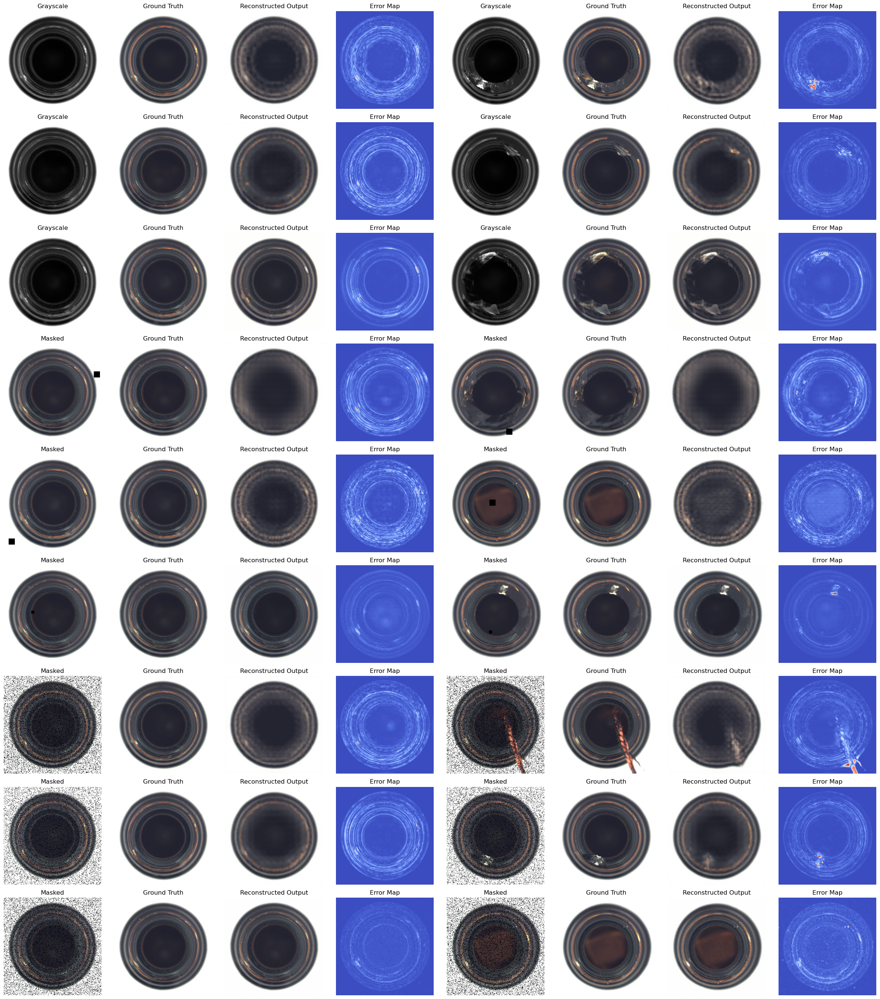

In [62]:
visualize_all_models_grid(
    trained_models=trained_models,
    data_loaders=val_loaders,
    dataset_name="mvtec_ad_bottle",
    device=device,
    num_images=1
)

# **4. Downstream Task: Anomaly Detection**

## **4.1. Anomaly Scoring Strategy**


#### **Proposed Method**:
- **Anomaly Score**: 
  - Instead of averaging the Mean Squared Error (MSE) across all pixels, the score will focus on the **top-k pixels with the highest reconstruction errors**.
- **Rationale**:
  - High-error regions are more likely to indicate anomalies, making the top-k approach more sensitive to local defects.
- **Hyperparameter**:
  - `k` (number of top pixels) will be treated as a tunable hyperparameter to optimize in the subsequent steps.

This approach leverages the reconstruction error distribution to better distinguish between **Good** and **Anomaly** samples.

## **4.2. Anomaly Detection and Evaluation**


#### **Overview**:
The `AnomalyDetector` class performs anomaly detection using pretrained reconstruction models. It computes anomaly scores, evaluates metrics, and provides visualizations for performance analysis.

#### **Key Features**:
1. **Anomaly Scoring**:
   - Computes scores based on the **top-k pixel-wise reconstruction errors**.
   - Focuses on high-error regions for better anomaly detection.

2. **Metrics Evaluation**:
   - Calculates key metrics: AUC, Precision, Recall, F1-Score.
   - Determines the **optimal threshold** using the ROC curve.

3. **Visualization Tools**:
   - **ROC Curve**: Assesses the model's discriminative power.
   - **Confusion Matrix**: Visualizes prediction performance.
   - **Score Distribution**: Displays separation of scores between good and anomaly samples.

4. **Customizable**:
   - Supports different datasets and tasks with the ability to adjust hyperparameters like `top-k`.

#### **Advantages**:
- Focuses on critical regions (`top-k` pixels) for scoring, which enhances sensitivity to anomalies.
- Combines numerical evaluation with intuitive visualizations for comprehensive performance analysis.

In [74]:
class AnomalyDetector:
    def __init__(self, model, criterion=nn.MSELoss(reduction='none'), device=None):
        """
        Class for anomaly detection using pretrained reconstruction models.

        Args:
            model: Trained reconstruction model (e.g., AE, UNet).
            criterion: Loss function to compute reconstruction error (default: MSELoss).
            device: Device for computation (default: detects GPU if available).
        """
        self.model = model
        self.criterion = criterion
        self.device = device if device else torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model.to(self.device)

    def compute_scores_and_labels(self, data_loader, topk=10):
        """
        Compute anomaly scores using the top-k pixel-wise losses and corresponding labels.

        Args:
            data_loader: DataLoader containing test data.
            topk: Number of largest pixel-wise losses to consider per image.

        Returns:
            scores: Numpy array of anomaly scores for all images.
            labels: Numpy array of true labels corresponding to the images.
        """
        self.model.eval()
        scores = []
        labels = []

        with torch.no_grad():
            for images, label in data_loader:
                images = images.to(self.device)
                label = label.to(self.device)

                # Get reconstruction from the model
                reconstructed, _ = self.model(images)

                # Compute pixel-wise loss
                loss = self.criterion(reconstructed, images)

                # Flatten loss per image and get top-k values
                loss_flat = loss.view(loss.size(0), -1)  # Shape: (batch_size, num_pixels)
                topk_loss = torch.topk(loss_flat, k=topk, dim=1).values  # Top-k pixel losses
                topk_mean = topk_loss.mean(dim=1)  # Average of the top-k values for each image

                scores.extend(topk_mean.cpu().numpy())
                labels.extend(label.cpu().numpy())

        return np.array(scores), np.array(labels)

    def evaluate_metrics(self, scores, labels):
        """
        Evaluate anomaly detection performance metrics.

        Args:
            scores: Array of anomaly scores.
            labels: Array of true labels.

        Returns:
            metrics: Dictionary containing AUC, precision, recall, F1-score, and optimal threshold.
            predictions: List of predicted labels for further analysis.
        """
        fpr, tpr, thresholds = roc_curve(labels, scores)
        roc_auc = auc(fpr, tpr)

        optimal_idx = np.argmax(tpr - fpr)
        optimal_threshold = thresholds[optimal_idx]
        predictions = (scores >= optimal_threshold).astype(int)

        # Calculate precision, recall, and F1-score
        precision = precision_score(labels, predictions, pos_label=1)
        recall = recall_score(labels, predictions, pos_label=1)
        f1 = f1_score(labels, predictions, pos_label=1)

        metrics = {
            "AUC": roc_auc,
            "Precision": precision,
            "Recall": recall,
            "F1-Score": f1,
            "Optimal Threshold": optimal_threshold,
        }

        return metrics, predictions

    def plot_roc(self, scores, labels, dataset_name):
        """
        Plot the ROC curve.

        Args:
            scores: Array of anomaly scores.
            labels: Array of true labels.
            dataset_name: Name of the dataset.
        """
        fpr, tpr, _ = roc_curve(labels, scores)
        roc_auc = auc(fpr, tpr)

        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve for {dataset_name}')
        plt.legend(loc="lower right")
        plt.grid(alpha=0.5)
        plt.tight_layout()
        plt.show()

    def plot_confusion_matrix(self, labels, predictions, dataset_name):
        """
        Plot the confusion matrix for the predictions.

        Args:
            labels: Array of true labels.
            predictions: Array of predicted labels.
            dataset_name: Name of the dataset.
        """
        cm = confusion_matrix(labels, predictions)
        cm_normalized = cm.astype('float') / cm.sum(axis=1, keepdims=True)  # Normalize per class

        plt.figure(figsize=(8, 6))
        sns.heatmap(cm_normalized, annot=True, fmt=".2f", cmap="Blues", xticklabels=["Good", "Anomaly"], yticklabels=["Good", "Anomaly"])
        plt.title(f"Confusion Matrix for {dataset_name}")
        plt.xlabel("Predicted Label")
        plt.ylabel("True Label")
        plt.show()

    def plot_score_distribution(self, labels, scores, threshold):
        """
        Plot the distribution of anomaly scores for good and anomaly samples.

        Args:
            labels: Array of true labels.
            scores: Array of anomaly scores.
            threshold: Decision boundary for anomaly detection.
        """
        # Separate scores based on labels
        good_scores = scores[labels == 0]
        anomaly_scores = scores[labels == 1]

        plt.figure(figsize=(8, 6))
        plt.hist(good_scores, bins=50, alpha=0.7, label="Good", color="blue", edgecolor='black')
        plt.hist(anomaly_scores, bins=50, alpha=0.7, label="Anomaly", color="orange", edgecolor='black')
        plt.axvline(x=threshold, color='red', linestyle='--', label="Threshold")
        plt.title("Anomaly Score Distribution")
        plt.xlabel("Anomaly Score")
        plt.ylabel("Frequency")
        plt.legend(loc="upper right")
        plt.grid(alpha=0.5)
        plt.tight_layout()
        plt.show()

    def evaluate(self, data_loader, dataset_name, topk, enable_plot=False):
        """
        Perform full anomaly detection evaluation.

        Args:
            data_loader: DataLoader containing the test dataset.
            dataset_name: Name of the dataset.

        Returns:
            metrics: Dictionary containing evaluation metrics.
            labels, predictions: True labels and predictions.
        """
        scores, labels = self.compute_scores_and_labels(data_loader, topk=topk)
        metrics, predictions = self.evaluate_metrics(scores, labels)
        if enable_plot:
            self.plot_roc(scores, labels, dataset_name)
            self.plot_score_distribution(labels, scores, metrics["Optimal Threshold"])
            self.plot_confusion_matrix(labels, predictions, dataset_name)
        return metrics, labels, predictions

## **4.3. Optimizing the `top-k` Hyperparameter**



#### **Purpose**:
- Find the optimal `top-k` value for anomaly scoring to maximize the AUC (Area Under Curve) metric.
- The `top-k` determines the number of highest reconstruction error pixels used to calculate the anomaly score.

#### **Process**:
1. A range of values: `[1, 50, 100, 500, 1000, 5000, 10000, 256*256]`.

2. Use the `optimize_topk` function to evaluate different `top-k` values on the validation set.

3. Select the `top-k` that yields the highest AUC for each model-dataset combination.
  

#### **Key Functions**:
- **`optimize_topk`**:
  - Evaluates AUC for each `top-k` value and selects the best one.
- **`optimize_topk_for_models`**:
  - Applies the `top-k` optimization for all models in the `trained_models` dictionary, for all datasets in `val_loaders`.

In [35]:
def optimize_topk(detector, val_loader, topk_values):
    """
    Optimize top-k parameter on the validation set based on AUC.

    Args:
        detector: AnomalyDetector instance.
        val_loader: DataLoader for the validation set.
        topk_values: List of top-k values to evaluate.

    Returns:
        best_topk: The top-k value with the best AUC score.
        results: Dictionary containing evaluation metrics for each top-k.
    """
    results = {}

    for topk in topk_values:
        # Compute anomaly scores and labels
        scores, labels = detector.compute_scores_and_labels(val_loader, topk=topk)

        # Compute metrics based on scores and labels
        metrics, _ = detector.evaluate_metrics(scores, labels)
        results[topk] = metrics
        print(f"Top-k: {topk} | AUC: {metrics['AUC']:.4f}")

    # Select the best top-k based on the highest AUC
    best_topk = max(results, key=lambda k: results[k]['AUC'])
    print(f"\nBest top-k: {best_topk} with AUC: {results[best_topk]['AUC']:.4f}")

    return best_topk, results

In [36]:
def optimize_topk_for_models(trained_models, val_loaders, topk_values):
    """
    Optimize top-k for each model-dataset combination in the trained_models dictionary.

    Args:
        trained_models: Dictionary where keys are dataset-model combinations,
                        and values are trained model instances.
        val_loaders: Dictionary where keys are dataset names, and values are DataLoaders.
        topk_values: List of top-k values to evaluate.

    Returns:
        best_topk_results: Dictionary with best top-k and AUC for each dataset-model pair.
    """
    best_topk_results = {}

    for key, model in trained_models.items():
        # Parse dataset name from the key
        dataset_name = key.rsplit('_', 1)[0]
        print(f"\nOptimizing top-k for {key} on {dataset_name}...")

        # Retrieve the corresponding DataLoader
        val_loader = val_loaders[dataset_name]
        detector = AnomalyDetector(model, criterion=nn.MSELoss(reduction='none'), device=device)

        #Optimize top-k for the current model
        best_topk, results = optimize_topk(detector, val_loader, topk_values)
        best_auc = results[best_topk]['AUC']

        # Save the result
        best_topk_results[key] = {"Best Top-k": best_topk, "AUC": best_auc}

    return best_topk_results

Running these above functions to find optimized `top-k` for each model with the best AUC score for anomaly detection.

In [37]:
# Check if the DataFrame has topk and AUC column
if "topk" in df_best_params.columns and "AUC" in df_best_params.columns:
    # Load the CSV file if it exists
    df_best_params = pd.read_csv(best_params_csv_path)
    print("CSV file already exists. Loaded into DataFrame:")
else:
    # Initialize topk and AUC column
    df_best_params["topk"] = None
    df_best_params["AUC"] = None

    topk_values = [1, 50, 100, 500, 1000, 5000, 10000, 256*256]
    best_topk_results = optimize_topk_for_models(trained_models, val_loaders, topk_values)


    for index, row in df_best_params.iterrows():
        model_dataset_key = row["Model_Dataset"]
        if model_dataset_key in best_topk_results:
            df_best_params.at[index, "topk"] = best_topk_results[model_dataset_key]["Best Top-k"]
            df_best_params.at[index, "AUC"] = best_topk_results[model_dataset_key]["AUC"]

    # Save the DataFrame to a CSV file
    df_best_params.to_csv(best_params_csv_path, index=False)
    print("CSV file created and saved.")

CSV file already exists. Loaded into DataFrame:


Green-highlight cells for the best AUC scores within each dataset group to improve result visibility.

In [38]:
num_models = 9

# Define a function to highlight the maximum values independently for each column
def highlight_max_per_column(data, num_models, columns_to_highlight):
    # Create a list to hold styles for each row
    styles = pd.DataFrame('', index=data.index, columns=columns_to_highlight)
    for col in columns_to_highlight:
        for start in range(0, len(data), num_models):
            end = min(start + num_models, len(data))  # Ensure not to go out of bounds
            # Find the index of the max value within the group for the current column
            max_idx = data.iloc[start:end][col].idxmax()
            styles.loc[max_idx, col] = 'background-color: lightgreen'
    return styles

# Apply the styling function
styled_df = df_best_params.style.apply(
    lambda x: highlight_max_per_column(df_best_params, num_models, ['AUC']).loc[x.index],
    axis=None
)

# Display the styled DataFrame
styled_df

,Model_Dataset,lr,latent_dim,mask_size,mask_ratio,val_loss,topk,AUC
0,engine_wiring_ColorizationModel,0.046416,512,nan,nan,0.009326,1000,0.790263
1,engine_wiring_AttentionColorizationModel,0.001000,64,nan,nan,0.091907,500,0.749453
2,engine_wiring_UNetColorizationModel,0.004642,256,nan,nan,0.007267,65536,0.668533
3,engine_wiring_InpaintingModel,0.046416,512,16.000000,nan,0.011094,65536,0.679074
4,engine_wiring_AttentionInpaintingModel,0.002154,256,16.000000,nan,0.220083,1000,0.695302
5,engine_wiring_UNetInpaintingModel,0.004642,512,8.000000,nan,0.003790,65536,0.699808
6,engine_wiring_MaskedAutoencoderModel,0.002154,512,nan,0.184739,0.020220,65536,0.689047
7,engine_wiring_AttentionMaskedAutoencoderModel,0.000002,128,nan,0.075713,0.174456,500,0.825584
8,engine_wiring_UNetMaskedAutoencoderModel,0.010000,64,nan,0.148265,0.002137,10000,0.720322
9,mvtec_ad_bottle_ColorizationModel,0.037276,256,nan,nan,0.002953,1,0.864516


## **4.4. Evaluating Models on the Final Test Set**



#### **Purpose**:
This function evaluates trained models using their optimal `top-k` values on the `final test set`, providing metrics for anomaly detection performance.

#### **Implementation**:

1. **Steps**:
   - Loop through each row of the DataFrame:
     - Extract dataset, model, and `top-k` value.
     - Create an instance of the `AnomalyDetector`.
     - Compute anomaly scores using the `top-k` parameter.
     - Evaluate metrics such as AUC, Precision, Recall, F1-Score, and the optimal threshold.
   - Append the evaluation results to a list and convert it into a DataFrame for easy analysis.

2. **Output**:
   - A new DataFrame with the following columns:
     - `Model_Dataset`: Combination of model and dataset.
     - `AUC_Test`: AUC score on the test set.
     - `AUC_Val`: AUC score from validation.
     - `Precision`, `Recall`, `F1-Score`, `Optimal Threshold`.

In [39]:
def create_and_evaluate_detectors(df, trained_models, final_test_loaders, device):
    """
    Create detectors for each model-dataset combination and evaluate on the test set.

    Args:
        df: DataFrame containing Model_Dataset and hyperparameters.
        trained_models: Dictionary of pre-trained models.
        final_test_loaders: Dictionary of test DataLoaders for each dataset.
        device: Device to perform evaluation on (e.g., "cuda" or "cpu").

    Returns:
        evaluation_df: DataFrame with evaluation metrics for each model-dataset pair.
    """
    results = []

    for _, row in df.iterrows():
        # Extract model and dataset details
        model_dataset = row["Model_Dataset"]
        dataset_name, model_name = model_dataset.rsplit('_', 1)
        topk = int(row["topk"])
        AUC_val = row["AUC"]

        # print(f"Evaluating {model_name} on {dataset_name} with top-k = {topk}...")

        # Get pre-trained model from the dictionary
        if model_dataset not in trained_models:
            print(f"Error: Model {model_dataset} not found in trained_models.")
            continue

        model = trained_models[model_dataset]

        # Ensure the model is on the correct device
        model.to(device)
        model.eval()

        # Create the detector
        detector = AnomalyDetector(model, criterion=nn.MSELoss(reduction='none'), device=device)

        # Evaluate on the test set
        test_loader = final_test_loaders[dataset_name]
        scores, labels = detector.compute_scores_and_labels(test_loader, topk=topk)
        metrics, predictions = detector.evaluate_metrics(scores, labels)

        # Append the evaluation results
        results.append({
            "Model_Dataset": model_dataset,
            "AUC_Test": metrics["AUC"],
            "AUC_Val": AUC_val,
            "Precision": metrics["Precision"],
            "Recall": metrics["Recall"],
            "F1-Score": metrics["F1-Score"],
            "Optimal Threshold": metrics["Optimal Threshold"]
        })

        # print(f"Results for {model_dataset}: AUC on test set = {metrics['AUC']:.4f}, AUC on val set = {AUC_val:.4f}\n")

    # Create a DataFrame to store results
    evaluation_df = pd.DataFrame(results)
    return evaluation_df

In [66]:
# Check if the file exists
file_path = "results/evaluation_results.csv"

if os.path.exists(file_path):
    # Load the existing file
    evaluation_df = pd.read_csv(file_path)
    status = "File loaded successfully."
else:
    # Create the DataFrame and save as CSV if the file does not exist
    evaluation_df = create_and_evaluate_detectors(df_best_params, trained_models, final_test_loaders, device=device)
    os.makedirs("results", exist_ok=True)  # Ensure the directory exists
    evaluation_df.to_csv(file_path, index=False)
    status = "File created and saved successfully."
status

'File loaded successfully.'

Green-highlight cells for the best AUC scores within each dataset group to improve result visibility.

In [67]:
# Apply the styling function
styled_df = evaluation_df.style.apply(
    lambda x: highlight_max_per_column(evaluation_df, num_models, ["AUC_Test", "AUC_Val"]).loc[x.index],
    axis=None
)

# Display the styled DataFrame
styled_df

,Model_Dataset,AUC_Test,AUC_Val,Precision,Recall,F1-Score,Optimal Threshold
0,engine_wiring_ColorizationModel,0.686878,0.790263,0.686747,0.708075,0.697248,0.087860
1,engine_wiring_AttentionColorizationModel,0.671806,0.749453,0.679487,0.658385,0.668770,0.128643
2,engine_wiring_UNetColorizationModel,0.617296,0.668533,0.636364,0.608696,0.622222,0.004924
3,engine_wiring_InpaintingModel,0.597229,0.679074,0.620000,0.577640,0.598071,0.005556
4,engine_wiring_AttentionInpaintingModel,0.575815,0.695302,0.594286,0.645963,0.619048,0.054948
5,engine_wiring_UNetInpaintingModel,0.670764,0.699808,0.704225,0.621118,0.660066,0.000259
6,engine_wiring_MaskedAutoencoderModel,0.604135,0.689047,0.631206,0.552795,0.589404,0.003815
7,engine_wiring_AttentionMaskedAutoencoderModel,0.195066,0.825584,1.000000,0.012422,0.024540,0.247974
8,engine_wiring_UNetMaskedAutoencoderModel,0.657820,0.720322,0.674242,0.552795,0.607509,0.001901
9,mvtec_ad_bottle_ColorizationModel,0.846875,0.864516,1.000000,0.656250,0.792453,0.336797


## **4.5. Evaluating Ensemble Voting**


#### **Purpose**:
Combine predictions from all 9 models for each dataset using **majority voting** to improve anomaly detection performance.

#### **Benefits**:
- Leverages multiple models' predictions for robust anomaly detection.
- Mitigates individual model weaknesses through ensemble aggregation.

In [68]:
def evaluate_ensemble_voting(df, trained_models, final_test_loaders, device):
    """
    Perform ensemble voting for anomaly detection across 9 models for each dataset.

    Args:
        df: DataFrame containing Model_Dataset and hyperparameters.
        trained_models: Dictionary of trained models.
        final_test_loaders: Dictionary of test DataLoaders for each dataset.
        device: Device to perform evaluation on (e.g., "cuda" or "cpu").

    Returns:
        ensemble_results_df: DataFrame containing ensemble AUC, precision, recall, and F1-score for each dataset.
    """
    ensemble_results = {}

    # Use dataset names from final_test_loaders keys
    datasets = final_test_loaders.keys()

    for dataset_name in datasets:
        #print(f"Evaluating ensemble voting for dataset: {dataset_name}")

        # Select models for the current dataset
        dataset_models = df[df['Model_Dataset'].str.startswith(dataset_name)]

        # Retrieve the test loader
        test_loader = final_test_loaders[dataset_name]

        # Initialize storage for model predictions and true labels
        all_predictions = []
        labels = None

        for _, row in dataset_models.iterrows():
            model_dataset = row['Model_Dataset']
            if pd.isna(model_dataset) or model_dataset not in trained_models:
                print(f"Error: Model {model_dataset} not found in trained_models.")
                continue

            # Get top-k value
            topk = int(row['topk'])

            # Retrieve the pre-trained model
            model = trained_models[model_dataset]
            model.to(device)
            model.eval()

            # Create the detector
            detector = AnomalyDetector(model, criterion=nn.MSELoss(reduction='none'), device=device)

            # Compute scores and predictions
            scores, labels = detector.compute_scores_and_labels(test_loader, topk=topk)
            fpr, tpr, thresholds = roc_curve(labels, scores)
            optimal_idx = np.argmax(tpr - fpr)
            optimal_threshold = thresholds[optimal_idx]
            predictions = (scores >= optimal_threshold).astype(int)

            all_predictions.append(predictions)

        # Ensure there are valid predictions
        if not all_predictions:
            print(f"Error: No valid predictions for dataset {dataset_name}.")
            continue

        # Combine predictions using majority voting
        combined_predictions = np.sum(all_predictions, axis=0) >= (len(all_predictions) // 2)

        # Evaluate ensemble predictions
        precision = precision_score(labels, combined_predictions, pos_label=1)
        recall = recall_score(labels, combined_predictions, pos_label=1)
        f1 = f1_score(labels, combined_predictions, pos_label=1)
        fpr, tpr, _ = roc_curve(labels, combined_predictions)
        ensemble_auc = auc(fpr, tpr)

        # Store the results
        ensemble_results[dataset_name] = {
            "AUC": ensemble_auc,
            "Precision": precision,
            "Recall": recall,
            "F1-Score": f1,
        }

        #print(f"Ensemble Results for {dataset_name}: AUC = {ensemble_auc:.4f}, F1-Score = {f1:.4f}")

    # Convert ensemble results to a DataFrame
    ensemble_results_df = pd.DataFrame.from_dict(ensemble_results, orient='index')
    ensemble_results_df.reset_index(inplace=True)
    ensemble_results_df.rename(columns={'index': 'Dataset'}, inplace=True)

    return ensemble_results_df

In [71]:
# Check if the file exists
file_path = "results/ensemble_results_df.csv"

if os.path.exists(file_path):
    # Load the existing file
    ensemble_results_df = pd.read_csv(file_path)
    status = "File loaded successfully."
else:
    # Create the DataFrame and save as CSV if the file does not exist
    ensemble_results_df = evaluate_ensemble_voting(df_best_params, trained_models, final_test_loaders, device=device)
    os.makedirs("results", exist_ok=True)  # Ensure the directory exists
    evaluation_df.to_csv(file_path, index=False)
    status = "File created and saved successfully."

status

'File created and saved successfully.'

In [72]:
# Initialize lists to store results
ensemble_aucs = []
best_model_aucs = []
best_model_names = []

# Dataset loaders
datasets = ["engine_wiring", "mvtec_ad_bottle", "mvtec_ad_capsule", "mvtec_ad_hazelnut", "mvtec_ad_toothbrush"]

# Iterate through each dataset
for dataset_name in datasets:
    # Extract Ensemble AUC
    ensemble_auc = ensemble_results_df.loc[ensemble_results_df['Dataset'] == dataset_name, 'AUC'].values[0]
    ensemble_aucs.append(ensemble_auc)

    # Extract Best Model AUC and Best Model Name from evaluation_df
    best_model_row = evaluation_df[evaluation_df['Model_Dataset'].str.startswith(dataset_name)].sort_values(by='AUC_Test', ascending=False).iloc[0]
    best_model_auc = best_model_row['AUC_Test']
    best_model_name = best_model_row['Model_Dataset'].rsplit("_", 1)[1]

    best_model_aucs.append(best_model_auc)
    best_model_names.append(best_model_name)

# Create the final DataFrame
final_results_df = pd.DataFrame({
    "Dataset": datasets,
    "Ensemble AUC": ensemble_aucs,
    "Best Model AUC": best_model_aucs,
    "Best Model Name": best_model_names
})

final_results_df

,Dataset,Ensemble AUC,Best Model AUC,Best Model Name
0,engine_wiring,0.652413,0.686878,ColorizationModel
1,mvtec_ad_bottle,0.812500,0.925000,MaskedAutoencoderModel
2,mvtec_ad_capsule,0.694444,0.677469,UNetInpaintingModel
3,mvtec_ad_hazelnut,0.935714,0.987143,AttentionColorizationModel
4,mvtec_ad_toothbrush,0.866667,0.922222,UNetColorizationModel


## **4.6. Final Evaluation of Best Models**



#### **Purpose**:
Perform a detailed evaluation of the best model for each dataset using the optimal `top-k` value. Generate visualizations and key metrics for anomaly detection performance.

#### **Output**:
- Visualizations for each dataset's best model.
- Key performance metrics for anomaly detection.

This step finalizes the evaluation process, validating the effectiveness of selected models and hyperparameters.

Evaluating Best Model: ColorizationModel on Dataset: engine_wiring
1000


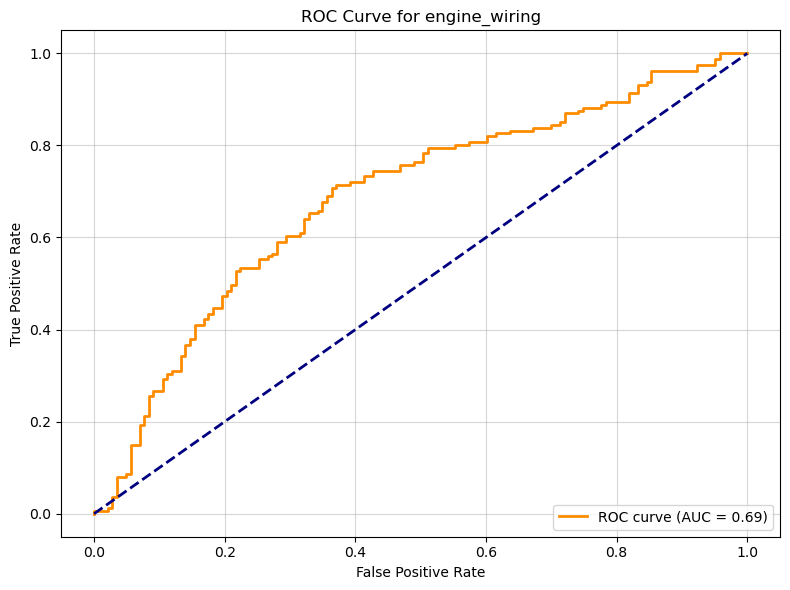

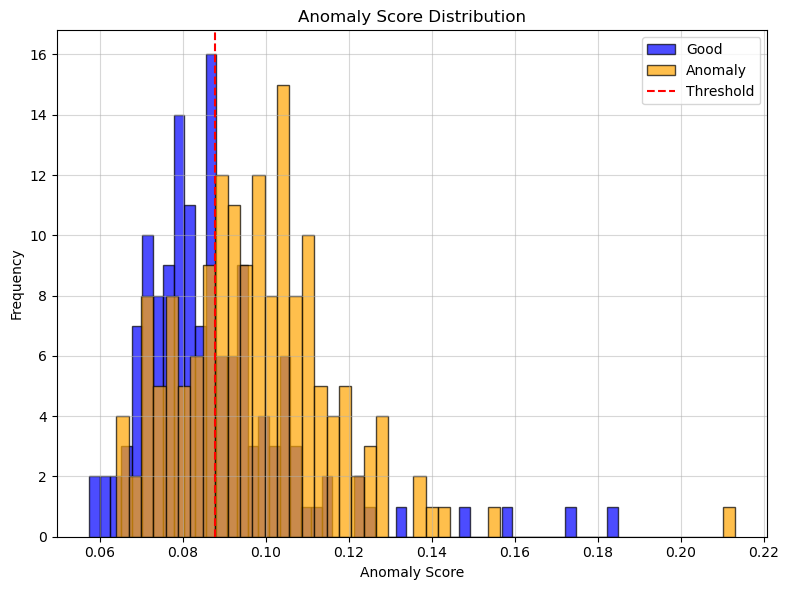

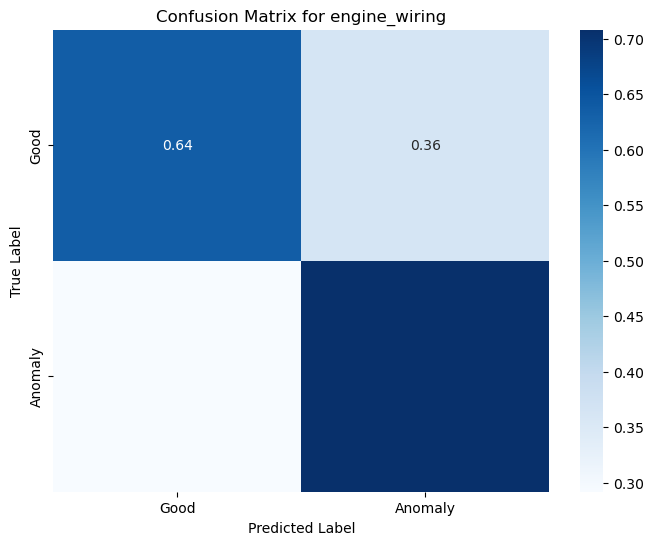

Metrics for ColorizationModel on engine_wiring:
  AUC: 0.6869
  Precision: 0.6867
  Recall: 0.7081
  F1-Score: 0.6972
  Optimal Threshold: 0.0879
Evaluating Best Model: MaskedAutoencoderModel on Dataset: mvtec_ad_bottle
1


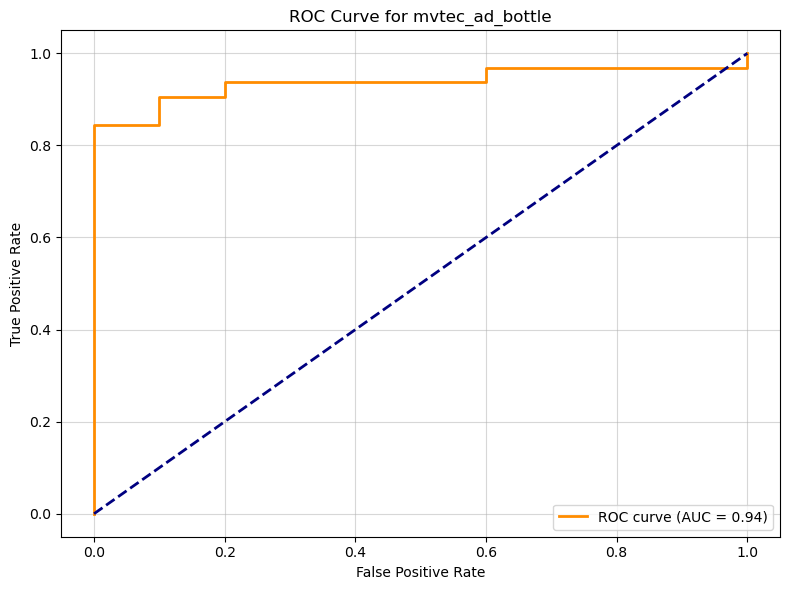

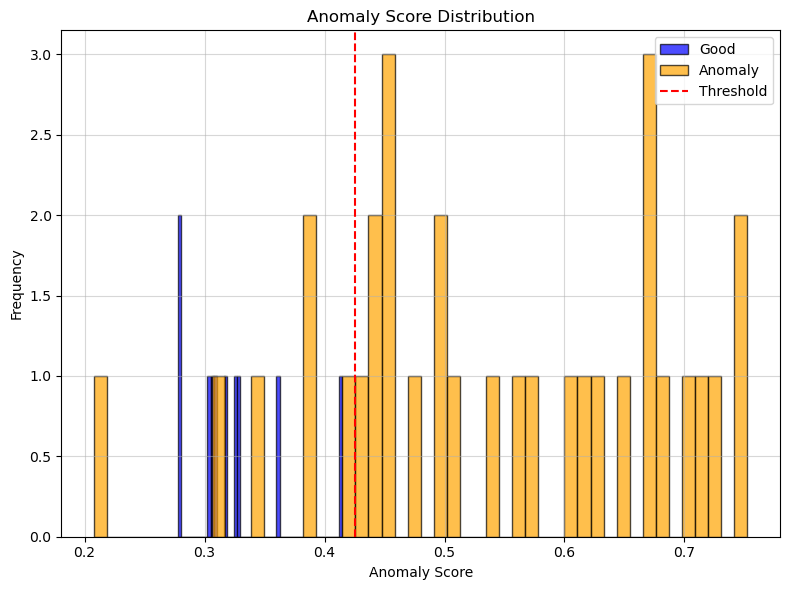

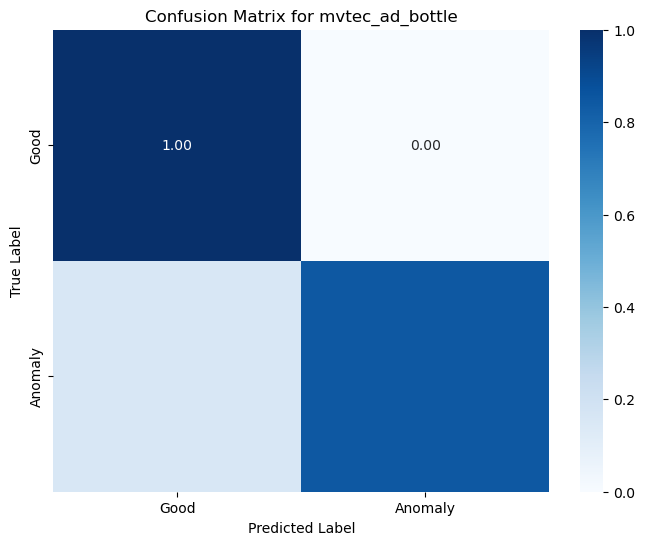

Metrics for MaskedAutoencoderModel on mvtec_ad_bottle:
  AUC: 0.9375
  Precision: 1.0000
  Recall: 0.8438
  F1-Score: 0.9153
  Optimal Threshold: 0.4251
Evaluating Best Model: UNetInpaintingModel on Dataset: mvtec_ad_capsule
100


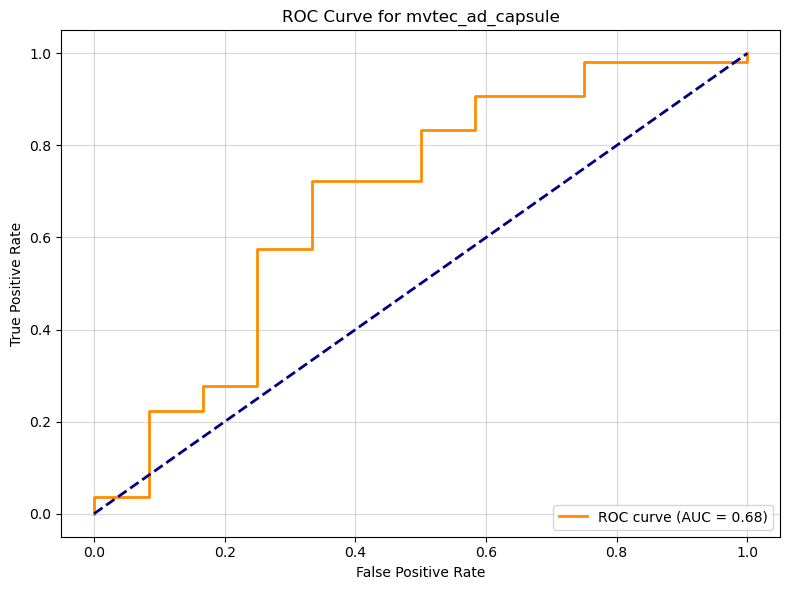

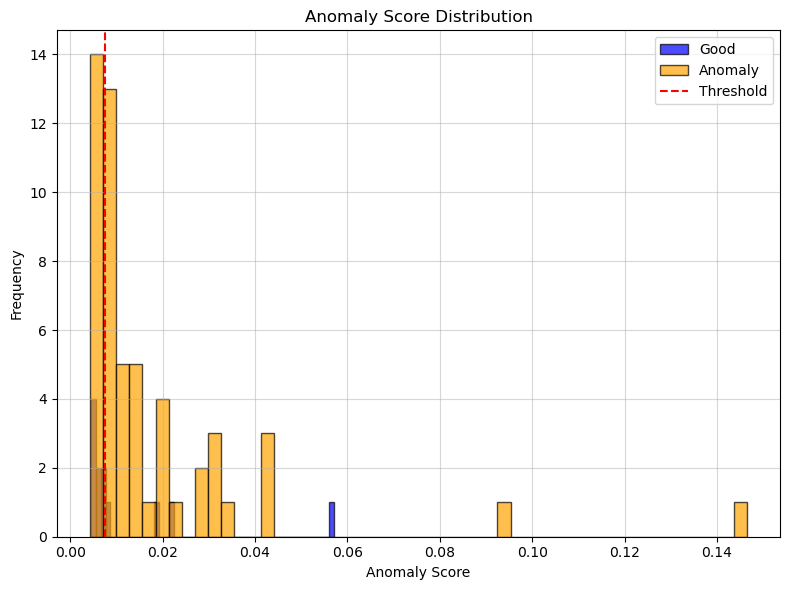

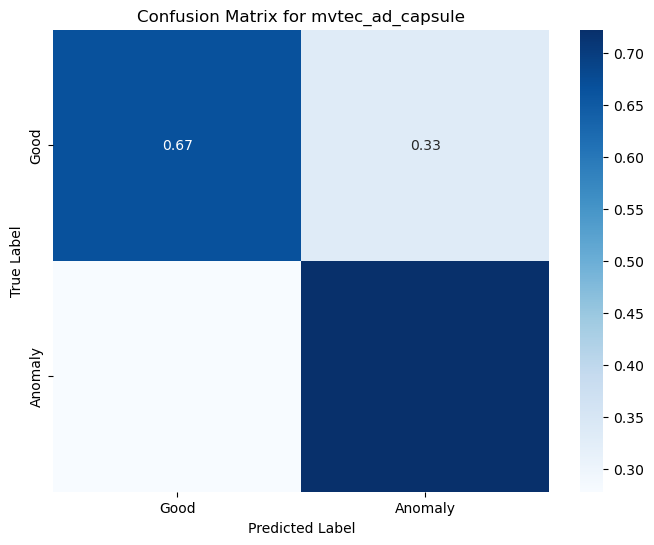

Metrics for UNetInpaintingModel on mvtec_ad_capsule:
  AUC: 0.6790
  Precision: 0.9070
  Recall: 0.7222
  F1-Score: 0.8041
  Optimal Threshold: 0.0075
Evaluating Best Model: AttentionColorizationModel on Dataset: mvtec_ad_hazelnut
50


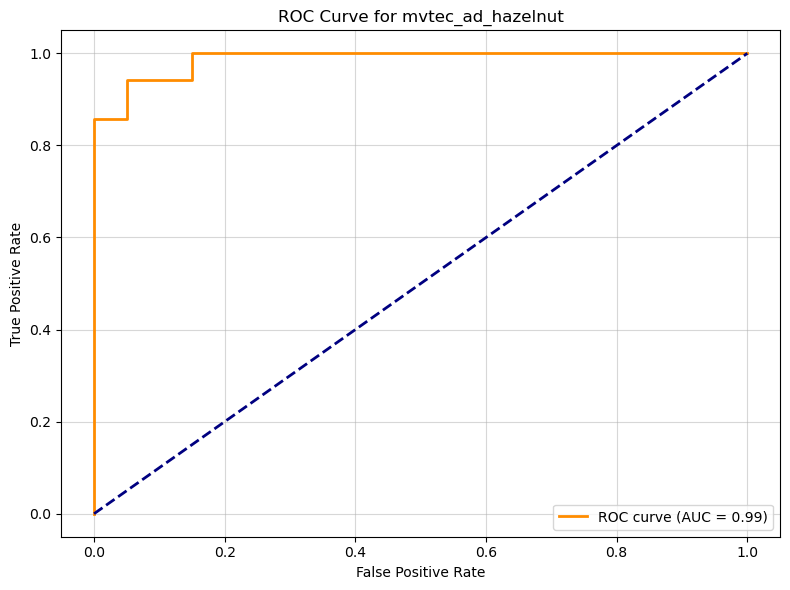

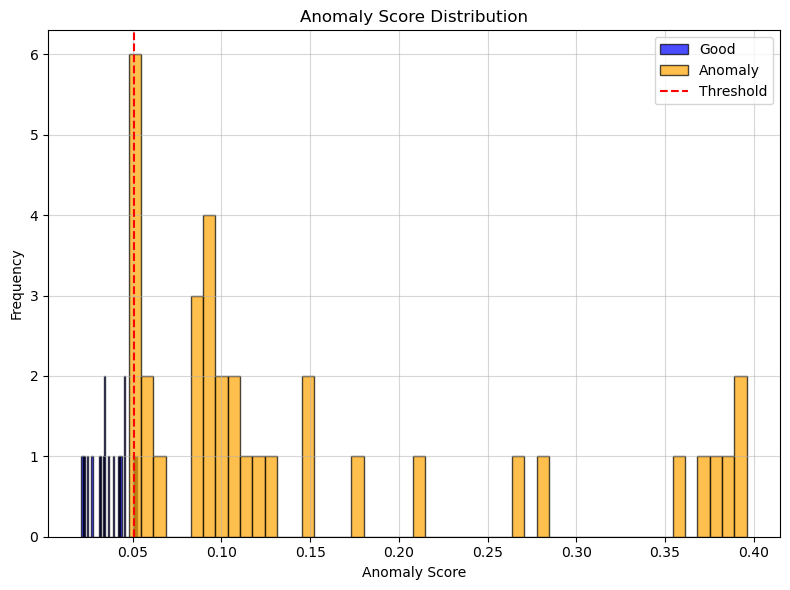

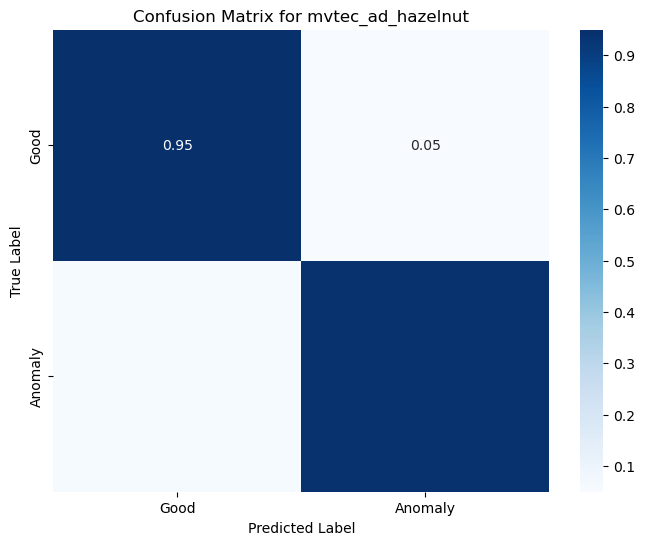

Metrics for AttentionColorizationModel on mvtec_ad_hazelnut:
  AUC: 0.9871
  Precision: 0.9706
  Recall: 0.9429
  F1-Score: 0.9565
  Optimal Threshold: 0.0509
Evaluating Best Model: UNetColorizationModel on Dataset: mvtec_ad_toothbrush
10000


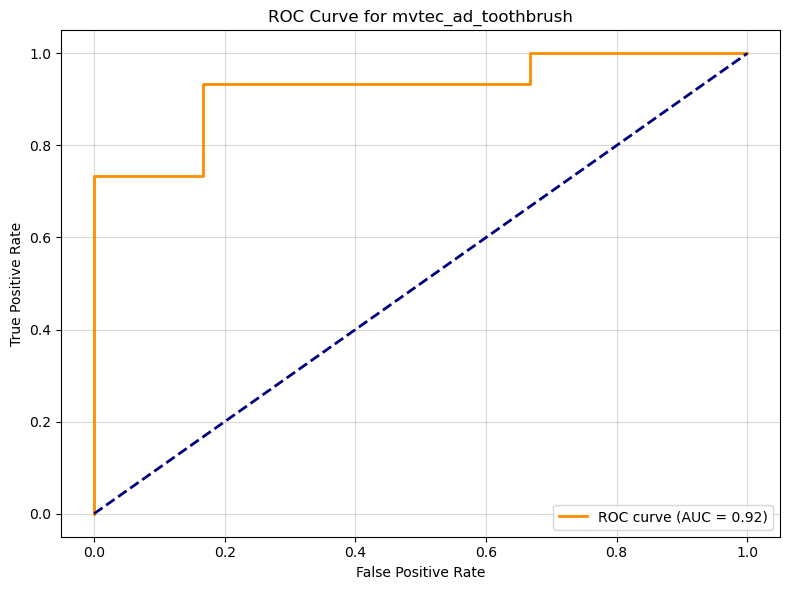

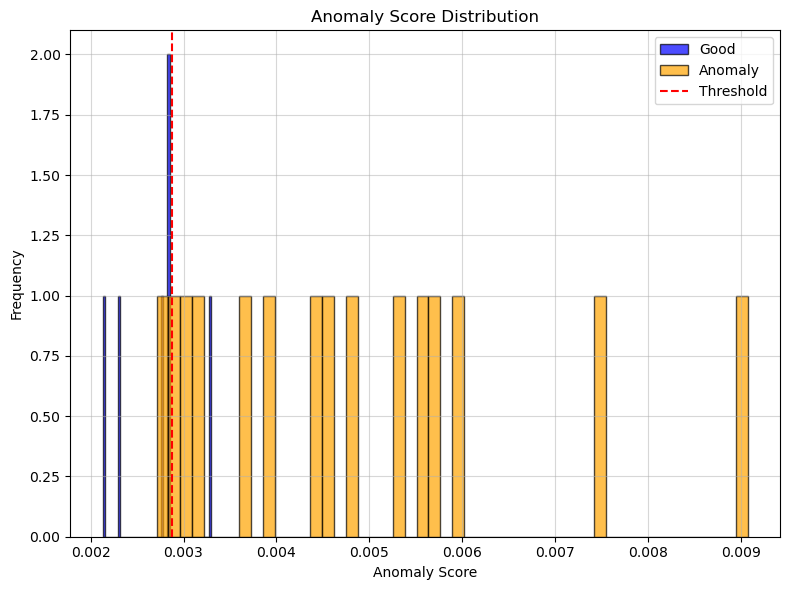

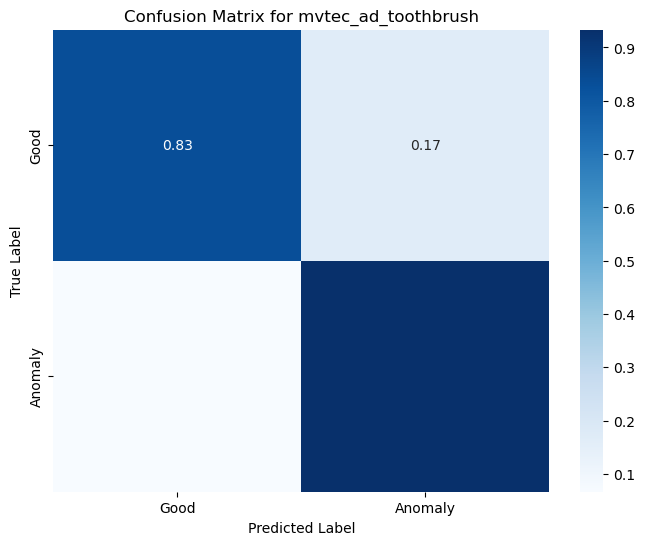

Metrics for UNetColorizationModel on mvtec_ad_toothbrush:
  AUC: 0.9222
  Precision: 0.9333
  Recall: 0.9333
  F1-Score: 0.9333
  Optimal Threshold: 0.0029


In [75]:
# Iterate through datasets and evaluate best models
for _, row in final_results_df.iterrows():
    dataset_name = row['Dataset']
    best_model_name = row['Best Model Name']

    print(f"Evaluating Best Model: {best_model_name} on Dataset: {dataset_name}")

    # Load the corresponding trained model
    best_model = trained_models[f"{dataset_name}_{best_model_name}"]
    best_model.to(device)
    best_model.eval()

    # Retrieve the `topk` value for the current model
    k = df_best_params.loc[df_best_params['Model_Dataset'] == f"{dataset_name}_{best_model_name}", 'topk'].values[0]
    print(k)

    # Create the detector
    detector = AnomalyDetector(best_model, criterion=nn.MSELoss(reduction='none'), device=device)

    # Get the test loader for the dataset
    test_loader = final_test_loaders[dataset_name]

    # Evaluate and plot results
    metrics, labels, predictions = detector.evaluate(test_loader, dataset_name, topk=k, enable_plot=True)

    # Display key metrics
    print(f"Metrics for {best_model_name} on {dataset_name}:")
    for metric, value in metrics.items():
        print(f"  {metric}: {value:.4f}")